<a href="https://colab.research.google.com/github/ErikGumilar/Marketing-Campaign-Analysis-with-Explanatory-Model-Analysis/blob/main/Analysis_of_Marketing_Campaigns.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![](https://c.tenor.com/tDQXUq-HakUAAAAC/why-just-why.gif)

Have you ever gotten a shopping promo with a big discount that coincided on a certain day? Let's say that every Friday the "BaBa" shopping app gives a 50% discount for 1 month. But when you check the next month the discount doesn't exist. Even though you already fall in love with the campaign.

Because of that decision of the company, you decide to change the maretplace you will spend your money in it.


**WAIT A MINUTE!!!**

![](https://c.tenor.com/Y5qoe-TQqRAAAAAC/pardon-me-excuse-me.gif)

All your feelings and thoughts are not true! Everything that has been done through careful analysis. Want to know what analysis is used to determine someone who will get promos more often?

# **Analysis on Marketing Campaigns Program**

[Estela Viñarás](https://www.cyberclick.net/numericalblogen/author/estela-vi%C3%B1ar%C3%A1s) once wrote on the Cyberclick Website with title of ["The Key Marketing Metrics You Should Analyze in Your Online Campaign"](https://www.cyberclick.net/numericalblogen/the-metrics-you-should-analyze-in-your-online-marketing-campaign), and she said that analysis is what makes **Marketing** a science rather than a game of chance. This statement has a logical truth. Because if marketing is just a gamble from a decision, the chances of achieving the goal will also be low, as low as the opportunity that will be obtained. Therefore we need an in-depth analysis of the marketing campaign or marketing a promotion to get the desired goal.

Besides to analyzing the marketing campaign, I also explained the model that I used. YES!!!

# **Explanatory Model Analysis: Dependent Model**

Let's jump right in!!!

## Download Package

We need to download our package before import them into our Code.
We gonna download 3 package that's we need. Such as:


1.   Skope-Rules

      Based on the [Groupe BPCE](http://2018.ds3-datascience-polytechnique.fr/wp-content/uploads/2018/06/DS3-309.pdf) explanation, Skope-Rules is a Python machine learning module built on top of scikit-learn and distributed under the 3-Clause BSD license. Skope-rules aims at learning logical, interpretable rules for "scoping" a target class, i.e. detecting with high precision instances of this class. Skope-rules is a trade off between the interpretability of a Decision Tree and the modelization power of a Random Forest.

2.   Eli5

      According to [Priyanka](https://www.analyticsvidhya.com/blog/author/priyanka870/) on [Analytics Vidhya](https://www.analyticsvidhya.com/blog/2020/11/demystifying-model-interpretation-using-eli5/), she explained that ELI5 is a python package that is used to inspect ML classifiers and explain their predictions. It is popularly used to debug algorithms such as sklearn regressors and classifiers, XGBoost, CatBoost, Keras, etc.
      
3.   Scikit-Plot

      [Davis David](https://davis-david.medium.com/) on [Towards Data Science](https://towardsdatascience.com/) with article's title ["The Six Key Things You Need to Know About Scikit-plot"](https://towardsdatascience.com/the-six-key-things-you-need-to-know-about-scikit-plot-119cbd869adb), he said Visualization is one of the most crucial components in data science and machine learning. Scikit-plot can help you to perform the task in your machine learning project. Scikit-plot is the python package that can help you visualize your data, model(during training), and experiment results at different stages of your machine learning project. Scikit-plot is a humble attempt to provide the opportunity to generate quick and beautiful graphs and plots with as little boilerplate as possible.

In [84]:
!pip install skope-rules
!pip install eli5
!pip install scikit-plot
!pip install shap
!pip install dalex
!pip install optuna

## Import Package

We need to import our package to execute our code.

In [196]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

# import pandas for data wrangling
import pandas as pd
# import numpy for vectorize data manipulation
import numpy as np
# import matplotlib.pyplot and seaborn module for data visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns 
from collections import Counter
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib as mpl
from matplotlib.gridspec import GridSpec

# features scaling
from sklearn.preprocessing import MinMaxScaler

# import train and test split method from scikit-learn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
# import metrics method for model evaluation
import sklearn.metrics as metrics
# load logistic regression model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
# load decision tree regression model
from sklearn.tree import DecisionTreeClassifier
# load random forest classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
# load multi-layer perceptron
from sklearn.neural_network import MLPClassifier
# load xgboost classifier
from xgboost import XGBClassifier
# load tree visualization
from sklearn.tree import plot_tree, export_text
from sklearn import tree

# load XGB specific module
import shap
pd.set_option("display.max_columns",None)
shap.initjs()
import xgboost as xgb
from sklearn.decomposition import PCA
import optuna   
import warnings
warnings.filterwarnings("ignore")

# load dalex
import dalex as dx

# load rulefit model
from skrules import SkopeRules

# load scikit-plot modules
import scikitplot as skplt

# load eli5
import eli5

## **Dataset**

Load our Data and take a simple looks at the Data.

In [86]:
data = pd.read_csv("https://raw.githubusercontent.com/hadimaster65555/dataset_for_teaching/main/dataset/marketing_campaign_response_model/marketing_campaign.csv", sep= ';')

In [87]:
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


## **Dataset Description**

In this dataset there are 29 features. The details are as follows:


1.   `ID` = Customer ID.
2.   `Year_Birth` = Customer's year of birth.
3.   `Education` = Customer's educational background.
4.   `Marital_Status` = Customer's married status.
5.   `Income` = Customer's yearly household income.
6.   `Kid_Home` = Number of small children in Customer's household.
7.   `Teen_Home` = Number of teenagers in Customer's household.
8.   `Dt_Customer` = Date of Customer's enrollment with Company.
9.   `Recency` = Number of days since the last purchase.
10.   `MntWines` = Amount spend on Wines in the last 2 years.
11.   `MntSweetProducts` = Amount spend on Sweet Products in the last 2 years.
12.   `MntFruits` = Amount spend on Fruits in the last 2 years.
13.   `MntMeatProducts` = Amount spend on Meat Priducts in the last 2 years.
14.   `MntFishProducts` = Amount spend on Fish in the last 2 years.
15.   `MntGoldProds` = Amount spend on *Gold* Products in the last 2 years.
16.   `NumDealsPuchase` = Number of purchase made with discount.
17.   `NumCatalogPurchase` = Number of purchase made using catalog.
18.   `NumStorePurchase` = Number of purchase made directly in store.
19.   `NumWebPurchase` = Number of purchase made through company website.
20.   `NumWebVisitsMonth` = Number of visits to company's web site in the last month
21.   `AcceptedCmp1` = 1 if Customer accepted the offer in the first campaign, 0 otherwise.
22.   `AcceptedCmp2` = 1 if Customer accepted the offer in the second campaign, 0 otherwise.
23.   `AcceptedCmp3` = 1 if Customer accepted the offer in the third campaign, 0 otherwise.
24.   `AcceptedCmp4` = 1 if Customer accepted the offer in the fourth campaign, 0 otherwise.
25.   `AcceptedCmp5` = 1 if Customer accepted the offer in the fifth campaign, 0 otherwise.
26.   `Complain` = 1 if Customer complained in the last 2 years.
27.   `Z_CostContact` = (not clearly explained in this dataset.)
28.   `Z_Revenue` = (not clearly explained in this dataset.)
29.   `Response` = 1 if customer accepted the offer in the last campaign, 0 otherwise

In [88]:
# data understanding and profilling
print("*"*8,"Data Understanding & Profilling","*"*8)
print("\n")

# data shape
print("There is", data.shape[0], "observation and", data.shape[1], "columns in this dataset")
print("\n")

# Data Information 
print("Data Info:", data.info())
print("\n")

# Numerical and Categorical Column
numerical= data.select_dtypes('number').columns
categorical = data.select_dtypes('object').columns

print(f'Numerical Columns:  {data[numerical].columns}')
print('\n')
print(f'Categorical Columns: {data[categorical].columns}')
print('\n')

# Statistical Summary of The Data
print("Statistical Description of Data:", data.describe())

******** Data Understanding & Profilling ********


There is 2240 observation and 29 columns in this dataset


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 n

### **Unique and Count of Value**

We must know about the unique value of categorical column and count it

In [89]:
# unique value in dataset
for i in data.columns:
    print(F'{i}:',len(data[i].unique()))

ID: 2240
Year_Birth: 59
Education: 5
Marital_Status: 8
Income: 1975
Kidhome: 3
Teenhome: 3
Dt_Customer: 663
Recency: 100
MntWines: 776
MntFruits: 158
MntMeatProducts: 558
MntFishProducts: 182
MntSweetProducts: 177
MntGoldProds: 213
NumDealsPurchases: 15
NumWebPurchases: 15
NumCatalogPurchases: 14
NumStorePurchases: 14
NumWebVisitsMonth: 16
AcceptedCmp3: 2
AcceptedCmp4: 2
AcceptedCmp5: 2
AcceptedCmp1: 2
AcceptedCmp2: 2
Complain: 2
Z_CostContact: 1
Z_Revenue: 1
Response: 2


In [90]:
print(f'There are:',data['Education'].unique(),'unique value on education column')
print(f'and the count of those unique value is:','\n', data['Education'].value_counts())
print('\n')
print(f'There are:',data['Marital_Status'].unique(),'unique value on marriage status column')
print(f'and the count of those unique value is:','\n', data['Marital_Status'].value_counts())

There are: ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle'] unique value on education column
and the count of those unique value is: 
 Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


There are: ['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO'] unique value on marriage status column
and the count of those unique value is: 
 Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64


As you can see, there are 3 columns that identified has object value. Those columns is `Education`, `Marital Status`, and `Customer_Dt`.

The problem on those columns:


1.   `Education` column has too much object such as `Graduation`, `2nd Cycle`, or `Basic`. Those value will be shortened into 4 uniques, `PhD`, `Master`, `Bachelor`, and `Basic`.
2.   Marital Status also has too much unique. It will shortened into `Married` and `Single`.
3.   `Customer_Dt` column will be transformed into `Date types`.





## **Data Cleaning**

Data cleaning is a critically important step in any machine learning project. Data Cleaning always refers to *identifying* and *correcting errors* in the Dataset that may negatively *impact* to our *predictive model*. But not only to *predictive model* that will be impacted by errors and also another models will be *impacted by errors of the dataset*.

### Missing Value

Missing values can heavily influence your models, depending on the way that you handle them. The fact the value is missing may have significant meaning within your model and your target problem. (source: [Zachary Warnes on Medium](https://towardsdatascience.com/missing-value-handling-missing-data-types-a89c0d81a5bb))


In [91]:
# Missing value Check on all of variable
data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [92]:
# drop the missing value
data = data.dropna(axis=0)
data.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

### Duplicated Rows

The same case as Missing Values, duplicated data is one of the problems in the dataset that needs to be eliminated to avoid misreading in our Machine Learning.
Duplication of data will cause prediction errors and also misclassification in machine learning.

In [93]:
# checking for duplicated rows
data.duplicated().sum()

0

In [94]:
# data shape
data.shape

(2216, 29)

## **Feature Engineering**

[Harshil Patel](https://harshilp.medium.com/) ever wrote articles about `Feature Engineering` in Towards Data Science. He said, `Feature Engineering` is the process of selecting, manipulating, and transforming raw data into features that can be used in supervised learning. 
Feature Engineering is a machine learning technique that leverages data to create new variables that aren’t in the training set. It can produce new features for both supervised and unsupervised learning, with the goal of **simplifying and speeding up data transformations** while also **enhancing model accuracy**. Feature engineering is required when working with machine learning models. Regardless of the data or architecture, a terrible feature will have a direct impact on your model.

### Value Transformation

In [95]:
# Replace value of Education
data['Education'] = data['Education'].replace(["2n Cycle","Master"],"Masters")
data['Education'] = data['Education'].replace(["Graduation"],"Bachelor")
print(f'Unique in Education column became shortened into:', data['Education'].unique())
print('\n')

# Replace value of Education
data['Marital_Status'] = data['Marital_Status'].replace(["Together","Married"],"Married")
data['Marital_Status'] = data['Marital_Status'].replace(["Divorced","Widow","Alone","Absurd","YOLO"],"Single")
print(f'Unique in Marital Status column became shortened into:', data['Marital_Status'].unique())
print('\n')

# Change Dt_Customer to datetime type
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'])
print(data['Dt_Customer'].dtypes, '\n')
print(data['Dt_Customer'].head())

Unique in Education column became shortened into: ['Bachelor' 'PhD' 'Masters' 'Basic']


Unique in Marital Status column became shortened into: ['Single' 'Married']


datetime64[ns] 

0   2012-09-04
1   2014-03-08
2   2013-08-21
3   2014-02-10
4   2014-01-19
Name: Dt_Customer, dtype: datetime64[ns]


After doing those transformation, we still need to create a several column to make the `Models` work properly.

### Age Column

In [96]:
# create age column from year_birth column
data['Age'] = 2021 - data['Year_Birth']
print(data['Age'].head())

# drop the year_birth column
data = data.drop('Year_Birth', axis=1)

0    64
1    67
2    56
3    37
4    40
Name: Age, dtype: int64


Actually the `Year_Birth` column can be maintained in our dataset but this will make the `Models` that we create have too many features or independent variables which result in reading errors or widening bias and variance in the `Models` itself.

We need to look up at the Age distribution.

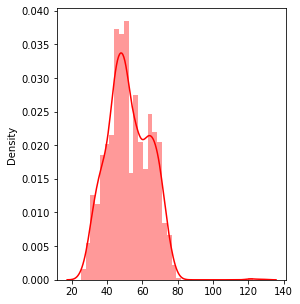

In [97]:
# visualization on Age
plt.figure(figsize = (14,5))
plt.subplot(1,3, 1)
sns.distplot(x = data['Age'], kde = True, color = 'red')

As you can see, there are a few number of Age greater than 80 years old. Those value can be identified as an anomalies. "Anomalies are often referred to as outliers in statistical terminology." [G. Sandhya Madhuri](https://link.springer.com/chapter/10.1007/978-981-15-0135-7_46).

In [98]:
# check the summary of Age
data['Age'].describe()

count    2216.000000
mean       52.179603
std        11.985554
min        25.000000
25%        44.000000
50%        51.000000
75%        62.000000
max       128.000000
Name: Age, dtype: float64

In [99]:
# drop those anomalies
data = data[data['Age'] < 100]
data['Age'].loc[data['Age'].idxmax()]

81

### Create Expenditure Column

We can make a `Expenditure` columns based on total spend on MntWines, MntFruits, MntMeatProducts,MntFishProducts, MntSweetProducts, and MntGoldProds.

In [100]:
# make Expenditure column
data['Expenditure'] = data['MntWines'] + data['MntSweetProducts'] + data['MntMeatProducts']+ data['MntGoldProds'] + data['MntFruits'] + data['MntFishProducts'] 

### Frequency Column

We also can make a `Frequency` column or  based on dollar spending on NumWebPurchases, NumCatalogPurchases, and NumStorePurchases.

In [101]:
data['Frequency'] = data['NumStorePurchases'] + data['NumCatalogPurchases'] + data['NumWebPurchases']

### Total Kids on the Family

In [102]:
# make child column
data['Children'] = data['Kidhome'] + data['Teenhome']

### Drop the Column

Drop the column that we have been sum up, such as, `Kidhome`, `Teenhome`, `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds`, `NumWebPurchases`, `NumCatalogPurchases`, and `NumStorePurchases`. Also drop unnecessary column, such as, `ID`, `Dt_Customer`, `Z_CostContact`, and `Z_Revenue`.

In [103]:
# drop unnecessary column
data = data.drop(['ID', 'Dt_Customer', 'Z_CostContact', 'Z_Revenue', 'Kidhome', 'Teenhome', 
              'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 
              'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases'], axis=1)

In [104]:
# look up at data shape again
data.shape

(2213, 16)

In [105]:
# look up the data info
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2213 entries, 0 to 2239
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Education          2213 non-null   object 
 1   Marital_Status     2213 non-null   object 
 2   Income             2213 non-null   float64
 3   Recency            2213 non-null   int64  
 4   NumWebVisitsMonth  2213 non-null   int64  
 5   AcceptedCmp3       2213 non-null   int64  
 6   AcceptedCmp4       2213 non-null   int64  
 7   AcceptedCmp5       2213 non-null   int64  
 8   AcceptedCmp1       2213 non-null   int64  
 9   AcceptedCmp2       2213 non-null   int64  
 10  Complain           2213 non-null   int64  
 11  Response           2213 non-null   int64  
 12  Age                2213 non-null   int64  
 13  Expenditure        2213 non-null   int64  
 14  Frequency          2213 non-null   int64  
 15  Children           2213 non-null   int64  
dtypes: float64(1), int64(13)

In [106]:
cat_count = 0
num_count = 0
for i in data.dtypes:
    if i == 'object':
        cat_count = cat_count + 1
    else:
        num_count = num_count + 1

print("Count of Numerical Column :",num_count)
print("Count of Categorical Column:",cat_count)

Count of Numerical Column : 14
Count of Categorical Column: 2


## Exploratory Data Analysis

In [107]:
# married status
print(Counter(data['Marital_Status']))

Counter({'Married': 1429, 'Single': 784})


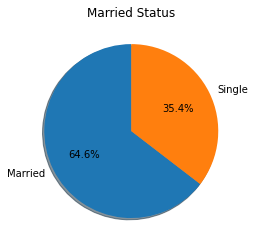

In [108]:
# marital status percentage
label = 'Married','Single'
plt.pie([len(data['Marital_Status'][data['Marital_Status']=='Married']),len(data['Marital_Status'][data['Marital_Status']=='Single'])],labels=label,autopct='%1.1f%%',shadow=True, startangle=90)
plt.title('Married Status');

**Visualization Explanation**:

The company's customers,there are 64.6% of customers were married couple and 35.4% single.

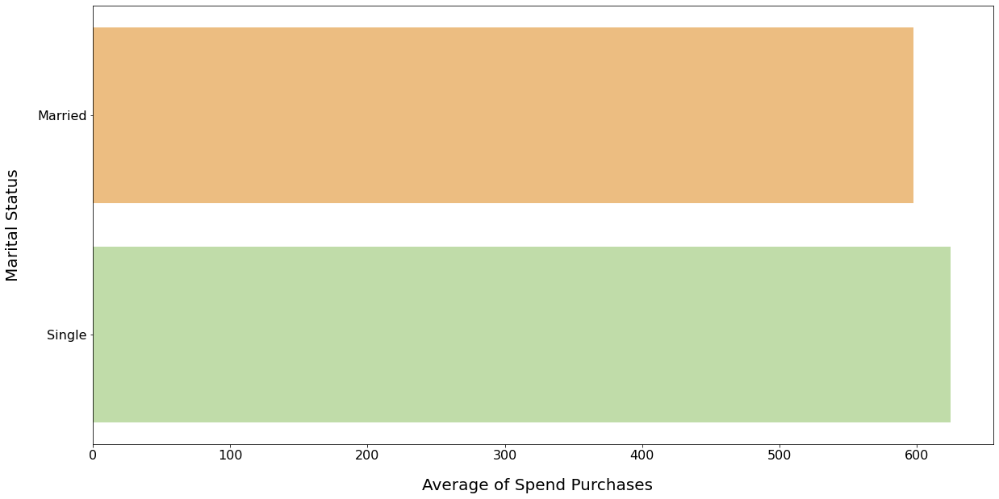

In [109]:
# marital status expenditures
married_expenditure = data.groupby('Marital_Status')['Expenditure'].mean().sort_values()
married_expenditure_data = pd.DataFrame(list(married_expenditure.items()), columns=['Marital Status', 'Average of Spend Purchases'])

plt.figure(1, figsize=(20,10)) 
sns.barplot(data = married_expenditure_data, x="Average of Spend Purchases", y="Marital Status", palette='Spectral');
plt.xticks( fontsize=16)
plt.yticks( fontsize=16)
plt.xlabel('Average of Spend Purchases  ', fontsize=20, labelpad=20)
plt.ylabel('Marital Status', fontsize=20, labelpad=20);

**Visualization Explanation**:

Single customers spend more in total on Company then Married customer.

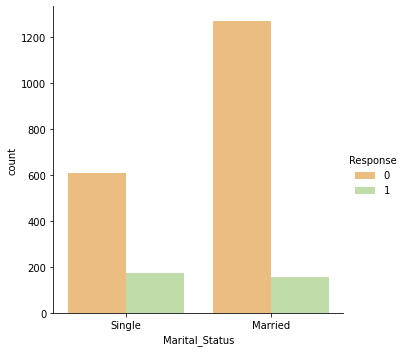

In [110]:
# marital status response to the promo
sns.catplot(x="Marital_Status", kind="count",hue = 'Response', palette="Spectral", data=data)

**Visualization Explanation**:

Single customers give a positive response to the promos given.

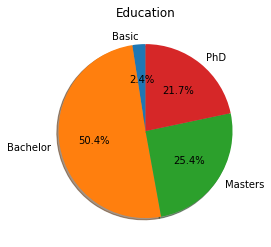

In [111]:
# customer educational background percentage
# marital status percentage
label = 'Basic','Bachelor','Masters','PhD'
plt.pie([len(data['Education'][data['Education']=='Basic']),len(data['Education'][data['Education']=='Bachelor']),len(data['Education'][data['Education']=='Masters']),len(data['Education'][data['Education']=='PhD'])],labels=label,autopct='%1.1f%%',shadow=True, startangle=90)
plt.title('Education');

**Visualization Explanation**:

The highest percentage of customer education background in this company is a bachelor's degree. Followed by master's degree and doctoral's degree.

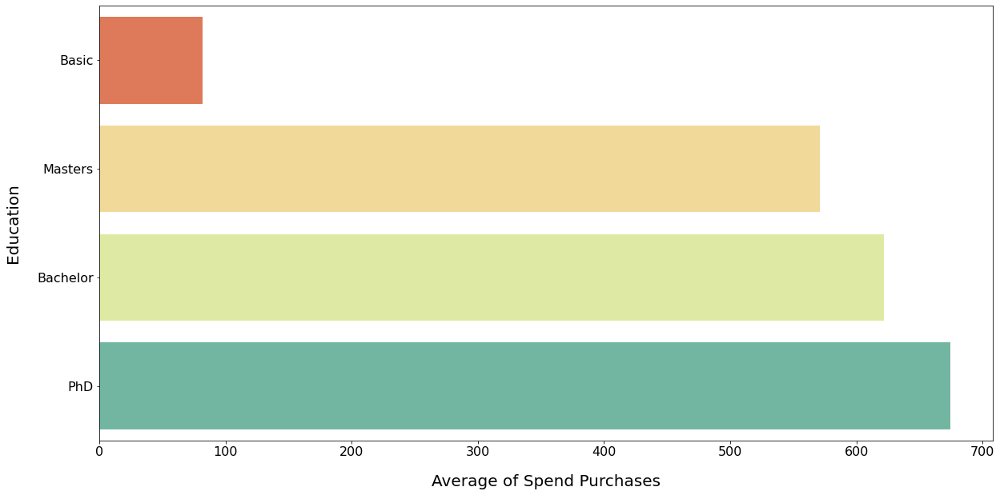

In [112]:
# educational background expenditures
educational_expenditure = data.groupby('Education')['Expenditure'].mean().sort_values()
educational_expenditure_data = pd.DataFrame(list(educational_expenditure.items()), columns=['Education', 'Average of Spend Purchases'])

plt.figure(1, figsize=(20,10)) 
sns.barplot(data = educational_expenditure_data, x="Average of Spend Purchases", y="Education", palette='Spectral');
plt.xticks( fontsize=16)
plt.yticks( fontsize=16)
plt.xlabel('Average of Spend Purchases', fontsize=20, labelpad=20)
plt.ylabel('Education', fontsize=20, labelpad=20);

**Visualization Explanation**:

However, from the aspect of spending the most expenditures are from doctoral's degree.

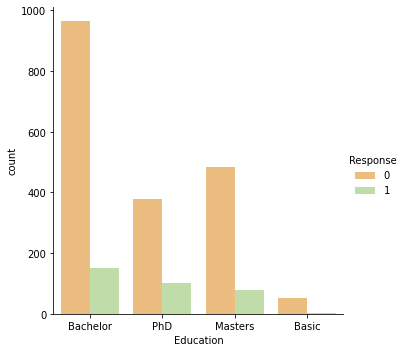

In [113]:
# customer educational background response to the promo
sns.catplot(x="Education", kind="count",hue = 'Response', palette="Spectral", data=data)

**Visualization Explanation**:

The response to the promo given, undergraduate graduates responded to the promo well and the most.

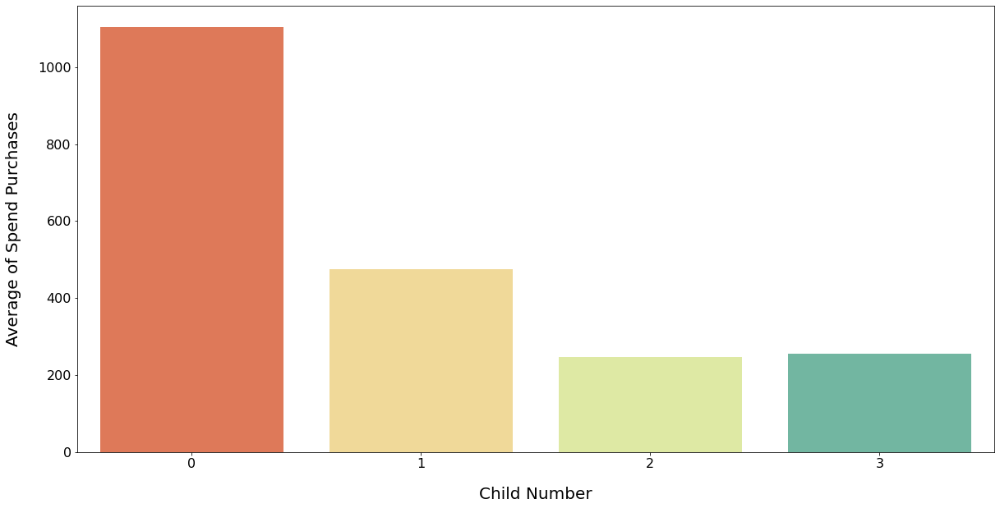

In [114]:
# family with/without children expenditures on the company
family_expenditure = data.groupby('Children')['Expenditure'].mean().sort_values()
family_expenditure_data = pd.DataFrame(list(family_expenditure.items()), columns=['Child Number', 'Average of Spend Purchases'])

plt.figure(1, figsize=(20,10)) 
sns.barplot(data = family_expenditure_data, y="Average of Spend Purchases", x="Child Number", palette='Spectral');
plt.xticks( fontsize=16)
plt.yticks( fontsize=16)
plt.xlabel('Child Number', fontsize=20, labelpad=20)
plt.ylabel('Average of Spend Purchases', fontsize=20, labelpad=20);

**Visualization Explanation**:

Customers who do not have children spend more money than customers who have children.

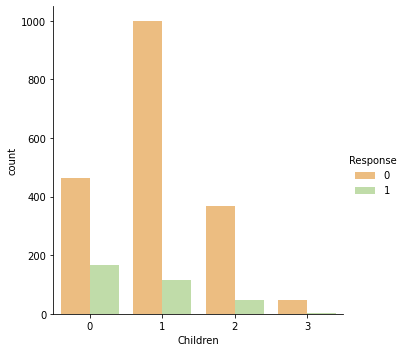

In [115]:
# family with/without response to the promo
sns.catplot(x="Children", kind="count",hue = 'Response', palette="Spectral", data=data)

**Visualization Explanation**:

Customers who do not have children give a positive response to the promos given.

<Figure size 1440x720 with 0 Axes>

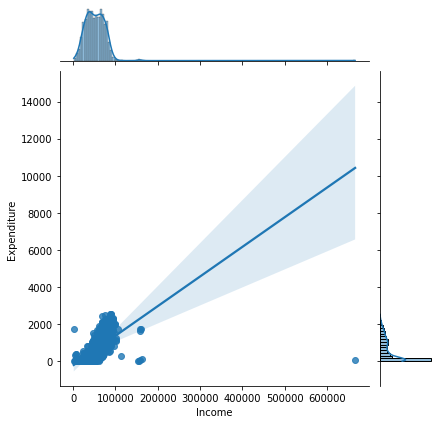

In [116]:
# income and expenditures
plt.figure(figsize=(20,10))
sns.jointplot(x='Income', y='Expenditure', data=data, kind='reg')
plt.xticks( fontsize=16)
plt.yticks( fontsize=16)
plt.xlabel('Income', fontsize=20, labelpad=20)
plt.ylabel('Spendings', fontsize=20, labelpad=20);

**Visualization Explanation**:

When customer has higher income their expenditures increase.

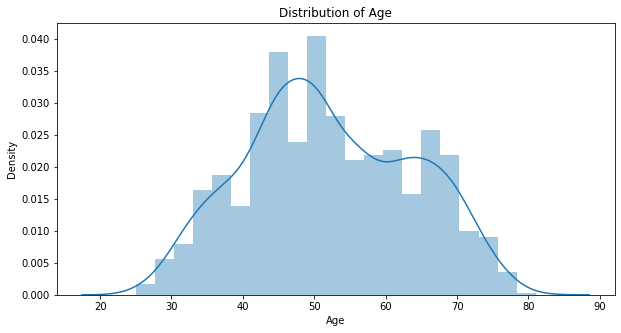

In [117]:
# distribution of age variabel
plt.figure(figsize=(10,5))
plt.title("Distribution of Age")
sns.distplot(data['Age'])
plt.show()

![](https://www.scribbr.com/wp-content/uploads/2020/10/standard-normal-distribution.png)

**Visualization Explanation**:

The picture above shows how a variable is has normal distribution. Although the visualization does not look the same, it can be said that the `Age` variable is normally distributed. But in this `Code`, we will do normalization to our data.

***Note***: only continuous numerical variabel that must be normally distribution.

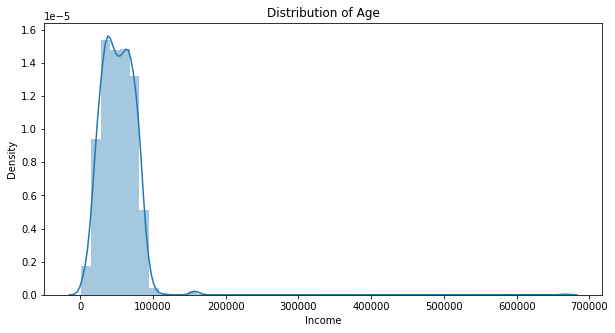

In [118]:
# distribution of income variabel
plt.figure(figsize=(10,5))
plt.title("Distribution of Age")
sns.distplot(data['Income'])
plt.show()

**Visualization Explanation**:

The `Income` variable looks more normally distributed than the age variable.

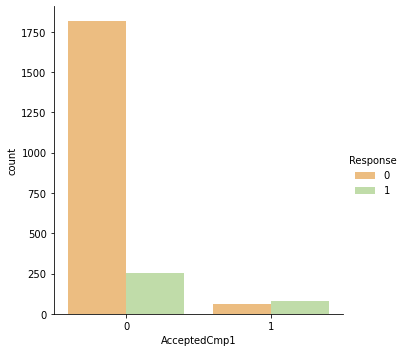

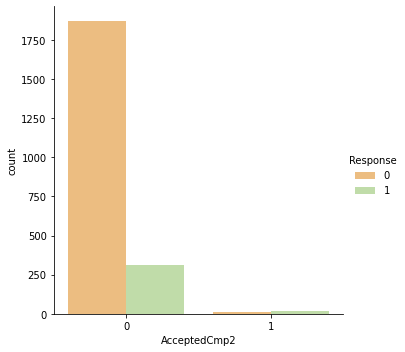

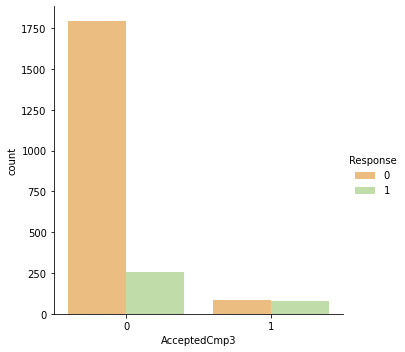

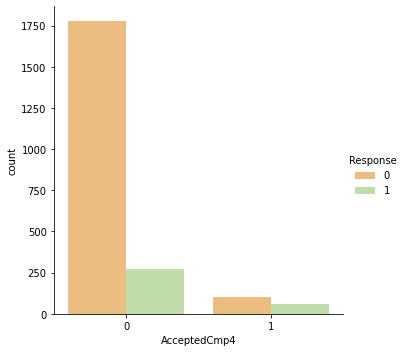

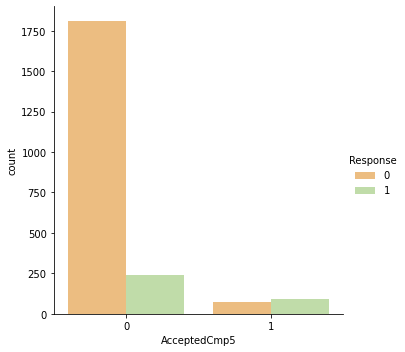

In [119]:
# promo
ax1 = sns.catplot(x="AcceptedCmp1", kind="count",hue = 'Response', palette="Spectral", data=data)
print(ax1)
print('\n')

ax2 = sns.catplot(x="AcceptedCmp2", kind="count",hue = 'Response', palette="Spectral", data=data)
print(ax2)
print('\n')

ax3 = sns.catplot(x="AcceptedCmp3", kind="count",hue = 'Response', palette="Spectral", data=data)
print(ax3)
print('\n')

ax4 = sns.catplot(x="AcceptedCmp4", kind="count",hue = 'Response', palette="Spectral", data=data)
print(ax4)
print('\n')

ax5 = sns.catplot(x="AcceptedCmp5", kind="count",hue = 'Response', palette="Spectral", data=data)
print(ax5)

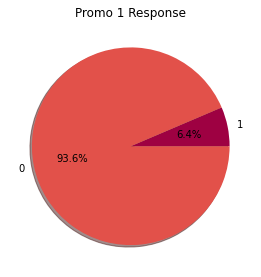

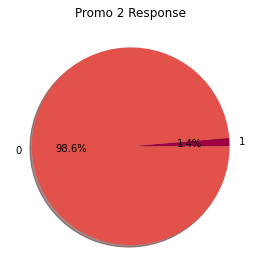

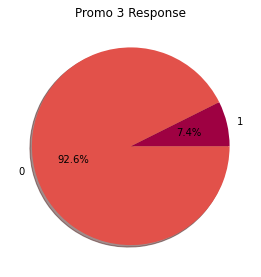

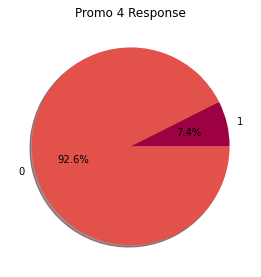

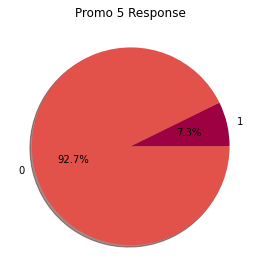

In [120]:
# promo response percentage
AcceptedCmp1_type = data.groupby('AcceptedCmp1').agg('count')
type_response1 = AcceptedCmp1_type.Response.sort_values().index
type_responsecount1 = AcceptedCmp1_type.Response.sort_values()
plt.figure(1, figsize=(20,10)) 
the_grid = GridSpec(2, 2)
cmap = plt.get_cmap('Spectral')
colors = [cmap(i) for i in np.linspace(0, 1, 8)]
plt.subplot(the_grid[0, 1], aspect=1, title='Promo 1 Response')
type_show_ids = plt.pie(type_responsecount1, labels=type_response1, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

print('\n')

AcceptedCmp2_type = data.groupby('AcceptedCmp2').agg('count')
type_response2 = AcceptedCmp2_type.Response.sort_values().index
type_responsecount2 = AcceptedCmp2_type.Response.sort_values()
plt.figure(1, figsize=(20,10)) 
the_grid = GridSpec(2, 2)
cmap = plt.get_cmap('Spectral')
colors = [cmap(i) for i in np.linspace(0, 1, 8)]
plt.subplot(the_grid[0, 1], aspect=1, title='Promo 2 Response')
type_show_ids = plt.pie(type_responsecount2, labels=type_response2, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

print('\n')

AcceptedCmp3_type = data.groupby('AcceptedCmp3').agg('count')
type_response3 = AcceptedCmp3_type.Response.sort_values().index
type_responsecount3 = AcceptedCmp3_type.Response.sort_values()
plt.figure(1, figsize=(20,10)) 
the_grid = GridSpec(2, 2)
cmap = plt.get_cmap('Spectral')
colors = [cmap(i) for i in np.linspace(0, 1, 8)]
plt.subplot(the_grid[0, 1], aspect=1, title='Promo 3 Response')
type_show_ids = plt.pie(type_responsecount3, labels=type_response3, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

print('\n')

AcceptedCmp4_type = data.groupby('AcceptedCmp4').agg('count')
type_response4 = AcceptedCmp4_type.Response.sort_values().index
type_responsecount4 = AcceptedCmp4_type.Response.sort_values()
plt.figure(1, figsize=(20,10)) 
the_grid = GridSpec(2, 2)
cmap = plt.get_cmap('Spectral')
colors = [cmap(i) for i in np.linspace(0, 1, 8)]
plt.subplot(the_grid[0, 1], aspect=1, title='Promo 4 Response')
type_show_ids = plt.pie(type_responsecount4, labels=type_response4, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

print('\n')

AcceptedCmp5_type = data.groupby('AcceptedCmp5').agg('count')
type_response5 = AcceptedCmp5_type.Response.sort_values().index
type_responsecount5 = AcceptedCmp5_type.Response.sort_values()
plt.figure(1, figsize=(20,10)) 
the_grid = GridSpec(2, 2)
cmap = plt.get_cmap('Spectral')
colors = [cmap(i) for i in np.linspace(0, 1, 8)]
plt.subplot(the_grid[0, 1], aspect=1, title='Promo 5 Response')
type_show_ids = plt.pie(type_responsecount5, labels=type_response5, autopct='%1.1f%%', shadow=True, colors=colors)
plt.show()

In [121]:
print("There are:","\n",data.groupby(['AcceptedCmp1', 'Response']).size().groupby(level=0).apply(lambda x:x))
print('\n')
print("There are:","\n",data.groupby(['AcceptedCmp2', 'Response']).size().groupby(level=0).apply(lambda x:x))
print('\n')
print("There are:","\n",data.groupby(['AcceptedCmp3', 'Response']).size().groupby(level=0).apply(lambda x:x))
print('\n')
print("There are:","\n",data.groupby(['AcceptedCmp4', 'Response']).size().groupby(level=0).apply(lambda x:x))
print('\n')
print("There are:","\n",data.groupby(['AcceptedCmp5', 'Response']).size().groupby(level=0).apply(lambda x:x))

There are: 
 AcceptedCmp1  Response
0             0           1817
              1            254
1             0             63
              1             79
dtype: int64


There are: 
 AcceptedCmp2  Response
0             0           1870
              1            313
1             0             10
              1             20
dtype: int64


There are: 
 AcceptedCmp3  Response
0             0           1794
              1            256
1             0             86
              1             77
dtype: int64


There are: 
 AcceptedCmp4  Response
0             0           1778
              1            271
1             0            102
              1             62
dtype: int64


There are: 
 AcceptedCmp5  Response
0             0           1810
              1            242
1             0             70
              1             91
dtype: int64


**Visualization Explanation**:

Company do a lot of promos or campaigns using the fourth and fifth methods compared to others. Most customers respond to the fifth campaign method compared to the fourth campaign method.

## **Pre-Processing**

[Sandhi Anunaya](https://www.analyticsvidhya.com/blog/author/sadhvianunaya/) wrote an article about [Data Preprocessing in Data Mining - A Hands On Guide](https://www.analyticsvidhya.com/blog/2021/08/data-preprocessing-in-data-mining-a-hands-on-guide/), and he said, "Data preprocessing is the process of transforming raw data into an understandable format. It is also an important step in data mining as we cannot work with raw data. The quality of the data should be checked before applying machine learning or data mining algorithms."

**Why is Data preprocessing important?**

Preprocessing of data is mainly to check the data quality. The quality can be checked by the following:


*   **Accuracy**: To check whether the data entered is correct or not.
*   **Completeness**: To check whether the data is available or not recorded.
*   **Consistency**: To check whether the same data is kept in all the places that do or do not match.
*   **Timeliness**: The data should be updated correctly.
*   **Believability**: The data should be trustable.
*   **Interpretability**: The understandability of the data.




### Outlier Handling

We all have heard of the idiom ‘odd one out which means something unusual in comparison to the others in a group.

Similarly, an Outlier is an observation in a given dataset that lies far from the rest of the observations. That means an outlier is vastly larger or smaller than the remaining values in the set.

**What do they affect?**

In statistics, we have three measures of central tendency namely `Mean`, `Median`, and `Mode`. They help us describe the data.

`Mean` is the accurate measure to describe the data when we do not have any outliers present.

`Median` is used if there is an outlier in the dataset.

`Mode` is used if there is an outlier AND about ½ or more of the data is the same.

`"Mean"` is the only measure of central tendency that is affected by the outliers which in turn impacts Standard deviation.

In [122]:
outlier = data[['Age','Income','Expenditure','Frequency']]

fig = px.box(outlier.melt(), y="value", facet_col="variable",facet_col_wrap=2, boxmode="overlay", color="variable",height=1000, width=900)
fig.update_yaxes(matches=None)

for i in range(len(fig["data"])):
    yaxis_name = 'yaxis' if i == 0 else f'yaxis{i + 1}'
    fig.layout[yaxis_name].showticklabels = True

fig.update_layout(showlegend=False)
fig.update_xaxes(showline=True, linewidth=2, linecolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='grey')

fig.show()

**Visualization Explanation**:

In the boxplot outliers visualization on `Age`, `Expenditure`, `Income`, and `Frequency` variable, there are outliers in the income variable. This variable is prone to have large outliers due to customer personal factors. Therefore, this outlier does not need to be removed.

### Encoding

In [123]:
# index married as 1, 0 for otherwise
data['Marital_Status'] = data['Marital_Status'].replace({'Married': 1,'Single': 0})

# index education as 3,2,1,0 for PhD, Masters, Bachelor, and Basic
data['Education'] = data['Education'].replace({'Basic': 0,
                                           'Bachelor': 1,
                                           'Masters': 2,
                                           'PhD': 3})

### Split The Data

In [124]:
yVar = data['Response']
xVar = data.loc[:, data.columns != 'Response']

In [125]:
X_train, X_test, y_train, y_test = train_test_split(xVar, yVar, test_size=0.3)
print(X_train.shape, y_train.shape)
print('\n')
print(X_test.shape, y_test.shape)

(1549, 15) (1549,)


(664, 15) (664,)


In [126]:
train_data_x = pd.DataFrame(X_train, columns=data.drop(['Response'], axis = 1).columns)
train_data_y = pd.DataFrame(y_train, columns=["Response"])
train_data = pd.concat([train_data_x, train_data_y], axis=1)

test_data_x = pd.DataFrame(X_test, columns=data.drop(['Response'], axis = 1).columns)
test_data_y = pd.DataFrame(y_test, columns=["Response"])
test_data = pd.concat([test_data_x, test_data_y], axis=1)

In [127]:
print(train_data,'\n\n')
print(test_data)

      Education  Marital_Status   Income  Recency  NumWebVisitsMonth  \
2155          2               1  32146.0       16                  6   
721           1               1  59111.0       90                  7   
1176          2               1  33444.0       24                  8   
1619          2               1  52973.0       92                  8   
440           1               1  28691.0       56                  8   
...         ...             ...      ...      ...                ...   
1813          1               1  63207.0       68                  7   
259           3               0  40737.0       24                  8   
1311          2               0  64857.0       78                  4   
102           1               1  85693.0       59                  5   
2194          1               1  73803.0       61                  6   

      AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
2155             0             0             0           

### Normalization 

**Why do we need to scale the variables in our dataset?**

Some machine learning algorithms are sensitive to feature scaling while others are virtually invariant to it. Let me explain that in more detail.

[Aniruddha](https://www.analyticsvidhya.com/blog/author/aniruddha/) on her articles called "[Feature Scaling for Machine Learning: Understanding the Difference Between Normalization vs. Standardization](analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/)", Normalization is a scaling technique in which values are shifted and rescaled so that they end up ranging between 0 and 1. It is also known as Min-Max scaling.

In [128]:
# train transform
col_train = train_data.columns
scaler = MinMaxScaler()
scaler.fit(train_data)
scaled_features = scaler.transform(train_data)
  ## convert to table format
norm_train_data = pd.DataFrame(data=scaled_features, columns=col_train)

# test transform
col_test = test_data.columns
scaler = MinMaxScaler()
scaler.fit(test_data)
scaled_features = scaler.transform(test_data)
  ## convert to table format
norm_test_data = pd.DataFrame(data=scaled_features, columns=col_test)

print(norm_train_data)
print('\n')
print(norm_test_data)

      Education  Marital_Status    Income   Recency  NumWebVisitsMonth  \
0      0.666667             1.0  0.189311  0.161616               0.30   
1      0.333333             1.0  0.357142  0.909091               0.35   
2      0.666667             1.0  0.197390  0.242424               0.40   
3      0.666667             1.0  0.318939  0.929293               0.40   
4      0.333333             1.0  0.167807  0.565657               0.40   
...         ...             ...       ...       ...                ...   
1544   0.333333             1.0  0.382636  0.686869               0.35   
1545   1.000000             0.0  0.242782  0.242424               0.40   
1546   0.666667             0.0  0.392906  0.787879               0.20   
1547   0.333333             1.0  0.522590  0.595960               0.25   
1548   0.333333             1.0  0.448586  0.616162               0.30   

      AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
0              0.0           0.0 

In [129]:
df_train = norm_train_data
df_test = norm_test_data

# make x and y
Xt = df_train.drop(['Response'], axis=1)
yt = df_train['Response']

Xtest = df_test.drop(['Response'], axis=1)
ytest = df_test['Response']

## **Modeling**

The outputs of prediction and feature engineering are a set of label times, historical examples of what we want to predict, and features, predictor variables used to train a model to predict the label. The process of modeling means training a machine learning algorithm to predict the labels from the features, tuning it for the business need, and validating it on holdout data.

### Logistic Regression

Thomas W. Edgar, David O. Manz, in [Research Methods for Cyber Security](https://www.sciencedirect.com/book/9780128053492/research-methods-for-cyber-security), Logistic regression is a process of modeling the probability of a discrete outcome given an input variable. The most common logistic regression models a binary outcome; something that can take two values such as true/false, yes/no, and so on. Multinomial logistic regression can model scenarios where there are more than two possible discrete outcomes. Logistic regression is a useful analysis method for classification problems, where you are trying to determine if a new sample fits best into a category. As aspects of cyber security are classification problems, such as attack detection, logistic regression is a useful analytic technique.

The fundamental equation of generalized linear model is:

`g(E(y)) = α + βx1 + γx2`

Here, `g()` is the link function, `E(y)` is the expectation of target variable and `α + βx1 + γx2` is the linear predictor ( `α`,`β`,`γ` to be predicted). The role of link function is to ‘link’ the expectation of y to linear predictor.

In [130]:
# logistic regression
logreg = LogisticRegression()
logreg.fit(Xt, yt)

# check model coeficient
logreg_coe = logreg.coef_
print(logreg_coe,'\n')

# check the intercept
logreg_inter = logreg.intercept_
print(logreg_inter)

[[ 0.75259212 -1.0754349  -0.26054618 -2.41746993  2.77240719  1.97496489
   0.67612834  1.5670552   0.93110157  0.71068316  0.26230258 -0.11094678
   1.60542709 -0.06700364 -1.22083483]] 

[-1.8212487]


**Model Interpretation on Coefficient and Intercept**:

**`Coefficient`** 

George Choueiry on his article called, "[Interpret Logistic Regression Coefficients](https://quantifyinghealth.com/interpret-logistic-regression-coefficients/)", logistic regression coefficient β associated with a predictor X is the expected change in log odds of having the outcome per unit change in X. So increasing the predictor by 1 unit (or going from 1 level to the next) multiplies the odds of having the outcome by e^β.

**`Intercept`**

George Choueiry also has an article called, "[Interpret the Logistic Regression Intercept](https://quantifyinghealth.com/interpret-logistic-regression-intercept/#:~:text=If%20the%20intercept%20has%20a,outcome%20will%20be%20exactly%200.5.)", he said,
`When X = 0, the intercept β0 is the log of the odds of having the outcome.`

Without even calculating this probability, if we only look at the sign of the coefficient, we can say that:



*   If the intercept has a negative sign: then the probability of having the outcome will be < 0.5.
*   If the intercept has a positive sign: then the probability of having the outcome will be > 0.5.
*   If the intercept is equal to zero: then the probability of having the outcome will be exactly 0.5.



With intercept value of `[-1.99276496]`, this means that the independent variable has a negative impact.

**Model Evaluation**

When it comes to evaluating a Binary Classifier, Accuracy is a well-known performance metric that is used to tell a strong classification model from one that is weak. Accuracy is, simply put, the total proportion of observations that have been correctly predicted. There are four (4) main components that comprise the mathematical formula for calculating Accuracy, viz. `TP`, `TN`, `FP`, `FN`, and these components grant us the ability to explore other ML Model Evaluation Metrics. The formula for calculating accuracy is as follows:

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2020/04/Equation_Accuracy.png) 

Where:


*   TP represents the number of True Positives. This refers to the total number of observations that belong to the positive class and have been predicted correctly.
*   TN represents the number of True Negatives. This is the total number of observations that belong to the negative class and have been predicted correctly.
*   FP is the number of False Positives. It is also known as a Type 1 Error. This is the total number of observations that have been predicted to belong to the positive class, but instead, actually, belong to the negative class.
*   FN is the number of False Negatives. It may be
referred to as a Type 2 Error. This is the total number of observations that
have been predicted to be a part of the negative class but instead belong to
the positive class.


**`Precision`**

This refers to the proportion (total number) of all observations that have been predicted to belong to the positive class and are actually positive. The formula for Precision Evaluation Metric is as follows:

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2020/04/Confusion-matrix_Precision.png)

**`Recall`**

This is the proportion of observation predicted to belong to the positive class, that truly belongs to the positive class. It indirectly tells us the model’s ability to randomly identify an observation that belongs to the positive class. The formula for Recall is as follows:

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2020/04/Confusion-matrix_Recall.png)

**`F1 Score`**

This is an averaging Evaluation Metric that is used to generate a ratio. The F1 Score is also known as the Harmonic Mean of the precision and recall Evaluation Metrics. This Evaluation Metric is a measure of overall correctness that our model has achieved in a positive prediction environment- 

i.e., Of all observations that our model has labeled as positive, how many of these observations are actually positive. The formula for the F1 Score Evaluation Metric is as follows:

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2020/05/rfc_vs_dt14-300x49.png)

**`ROC-AUC`**

The Receiver Operator Characteristic (ROC) curve is an evaluation metric for binary classification problems. It is a probability curve that plots the TPR against FPR at various threshold values and essentially separates the ‘signal’ from the ‘noise’. The Area Under the Curve (AUC) is the measure of the ability of a classifier to distinguish between classes and is used as a summary of the ROC curve.

The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.

![](https://cdn.analyticsvidhya.com/wp-content/uploads/2020/06/AUC1.png)

In [131]:
# predict
y_pred_logreg = logreg.predict(Xtest)
y_pred_proba_logreg = logreg.predict_proba(Xtest)

# report result
logreg_report = pd.DataFrame(metrics.classification_report(ytest, y_pred_logreg, target_names=['Do Not Response','Responsed'], output_dict=True))
print("Below is the report of the Logistic Regression model results:","\n",logreg_report)

Below is the report of the Logistic Regression model results: 
            Do Not Response   Responsed  accuracy   macro avg  weighted avg
precision         0.890523    0.692308     0.875    0.791415      0.859776
recall            0.971480    0.349515     0.875    0.660497      0.875000
f1-score          0.929241    0.464516     0.875    0.696879      0.857153
support         561.000000  103.000000     0.875  664.000000    664.000000


Based on:

1.   `Precision`: 89.05% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 97.14%
3.   `F1-Score`: F1-Score value of 92.92% of comparison on Precision and Recall.

Logistic Regression Confusion Matrix:
 AxesSubplot(0.125,0.125;0.62x0.755) 



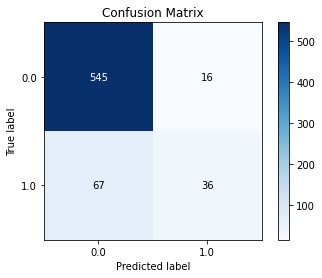

In [132]:
# confusion Matrix
from sklearn.metrics import confusion_matrix
logreg_cm = skplt.metrics.plot_confusion_matrix(ytest,y_pred_logreg)
print('Logistic Regression Confusion Matrix:\n',logreg_cm,'\n')

**Confusion Matrix**

Interpretation of Confusion Matrix:

*   The model predicted response and the customer actually response is 36 (True Positive)
*   The model predicted not response and the customer actually response is 67 (False Negative)
*   The model predicted response and the customer actually not response is 16 (False Positive)
*   The model predicted not response and the customer actually not response is 545 (True Negative)


**ROC AUC Curve**

[Sarang Narkhede](https://medium.com/@narkhedesarang) on Medium with article "[Understanding AUC - ROC Curve](https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5#:~:text=Higher%20the%20AUC%2C%20the%20better,is%20on%20the%20x%2Daxis.)", he said, AUC - ROC curve is a performance measurement for the classification problems at various threshold settings. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes.

Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1. By analogy, the Higher the AUC, the better the model is at distinguishing between patients with the disease and no disease.

The ROC curve is plotted with TPR against the FPR where TPR is on the y-axis and FPR is on the x-axis.


![](https://miro.medium.com/max/722/1*pk05QGzoWhCgRiiFbz-oKQ.png) 



Below is the ROC-AUC result on Logistic Regression:
 AxesSubplot(0.125,0.125;0.775x0.755) 



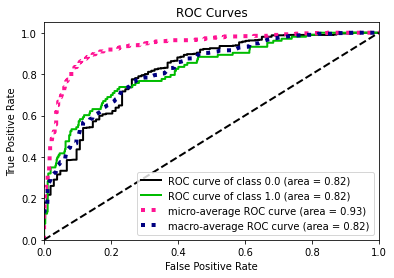

In [133]:
# check ROC-AUC curve and result
logreg_ROC_AUC = skplt.metrics.plot_roc_curve(ytest,y_pred_proba_logreg)
print("Below is the ROC-AUC result on Logistic Regression:\n",logreg_ROC_AUC,'\n')

**ROC-AUC Visualization**

The model succeed to distinct between True Positive and True Negative with chance 82%

In [134]:
# check f1-score
logreg_f1_score = metrics.f1_score(ytest,y_pred_logreg)
print("The F1 score on Logistic Regression is:",logreg_f1_score,'\n')

# Accuracy of logistic regression
logreg_accuracy = metrics.accuracy_score(ytest, y_pred_logreg)
print("The accuracy for Logistic Regression is:",logreg_accuracy)

The F1 score on Logistic Regression is: 0.4645161290322581 

The accuracy for Logistic Regression is: 0.875


**Weight Plot**

In [135]:
var_name = data.drop(['Response'], axis = 1).columns.tolist()

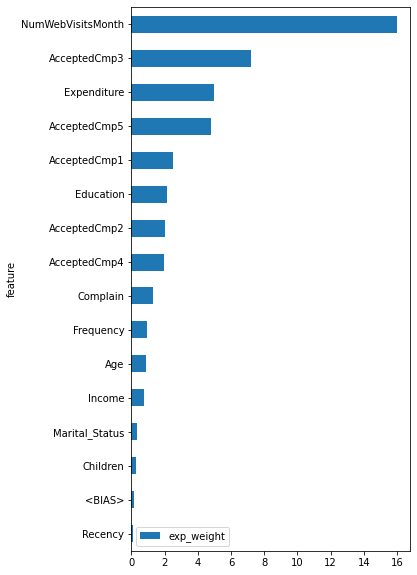

In [136]:
eli5.explain_weights_df(
    logreg, feature_names= var_name
).assign(
    # create new weight called exp_weight
    exp_weight = lambda x: x['weight'].map(lambda x: np.exp(x))
).sort_values(
    by = "exp_weight"
).plot(
    x = 'feature',
    y = 'exp_weight',
    kind = 'barh',
    figsize = (5,10)
)

### Hyperparameters Logistic Regression


In [137]:
# hyperparameter will be test
penalty = ['l1','l2','elasticnet', 'none']
C = np.logspace(-4,4,20)
solver = ['lbfgs','newton-cg','liblinear','sag','saga']
max_iter = [100, 1000,2500, 5000, 10000]

# change into dictionary
hyperparameters = dict(penalty=penalty, C=C, solver=solver, max_iter=max_iter)

# define logreg hyperparam
logreg_hyper = LogisticRegression(random_state=42)

# put into grid search
logreg_clf = GridSearchCV(logreg_hyper, hyperparameters, cv=10, verbose=1, n_jobs=-1)

#Fitting Model
best_logreg_hyper = logreg_clf.fit(Xt,yt)

Fitting 10 folds for each of 2000 candidates, totalling 20000 fits


In [138]:
# best hyperparameters
print('Best Penalty:', best_logreg_hyper.best_estimator_.get_params()['penalty'])
print('Best C:', best_logreg_hyper.best_estimator_.get_params()['C'])
print('Best Solver:', best_logreg_hyper.best_estimator_.get_params()['solver'])
print('Best Max_Iter:', best_logreg_hyper.best_estimator_.get_params()['max_iter'])

Best Penalty: l1
Best C: 0.615848211066026
Best Solver: saga
Best Max_Iter: 100


In [139]:
logreg_best_estimator = best_logreg_hyper.best_estimator_
print("The best Parameter for Logistic Regression are:\n\n", logreg_best_estimator)

The best Parameter for Logistic Regression are:

 LogisticRegression(C=0.615848211066026, penalty='l1', random_state=42,
                   solver='saga')


**Best Parameter** for Logistic Regression model are:


*   Best Penalty: l1
*   Best C value: 0.615848211066026
*   Best Solver: saga
*   Best Max_Iter: 100

**Model Evaluation**

In [140]:
# predict
y_pred_logreg_hyper = best_logreg_hyper.predict(Xtest)
y_pred_proba_logreg_hyper = best_logreg_hyper.predict_proba(Xtest)

# report result
logreg_hyper_report = pd.DataFrame(metrics.classification_report(ytest, y_pred_logreg_hyper, target_names=['Do Not Response','Responsed'], output_dict=True))
print("Below is the report of the Hyperparameter Tuning on Logistic Regression Classifier model results:","\n",logreg_hyper_report,'\n')

Below is the report of the Hyperparameter Tuning on Logistic Regression Classifier model results: 
            Do Not Response   Responsed  accuracy   macro avg  weighted avg
precision         0.890344    0.679245  0.873494    0.784794      0.857598
recall            0.969697    0.349515  0.873494    0.659606      0.873494
f1-score          0.928328    0.461538  0.873494    0.694933      0.855919
support         561.000000  103.000000  0.873494  664.000000    664.000000 



Based on:

1.   `Precision`: On the Precision, there is 89.03% value in the 'Do Not Response' prediction.
2.   `Recall`: On the sensitivity of the model by 96.96%
3.   `F1-Score`: F1-Score value is 92.83%.

Confusion Matrix on Logistic Regression Tuning:
 AxesSubplot(0.125,0.125;0.62x0.755)


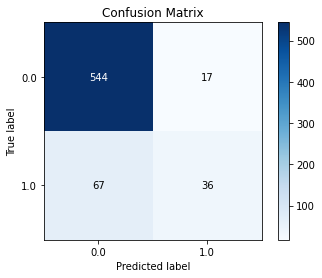

In [141]:
logreg_hyper_cm = skplt.metrics.plot_confusion_matrix(ytest,y_pred_logreg_hyper)
print('Confusion Matrix on Logistic Regression Tuning:\n',logreg_hyper_cm)

**Confusion Matrix**

Interpretation of Confusion Matrix:

*   The model predicted response and the customer actually response is 36 (True Positive) which is decreased from previous prediction.
*   The model predicted not response and the customer actually response is 67 (False Negative) which is increased from previous prediction.
*   The model predicted response and the customer actually not response is 17 (False Positive)
*   The model predicted not response and the customer actually not response is 544 (True Negative)


AxesSubplot(0.125,0.125;0.775x0.755)


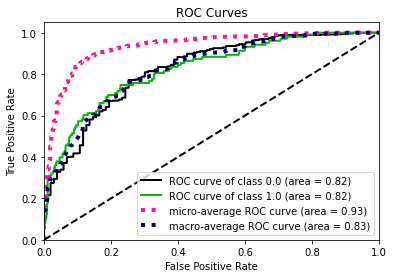

In [142]:
# model performance check
logreg_hyper_ROC_AUC = skplt.metrics.plot_roc_curve(ytest, y_pred_proba_logreg_hyper)
print(logreg_hyper_ROC_AUC)

**ROC-AUC Visualization**

The model succeed to distinct between True Positive and True Negative with chance 82%

In [143]:
# check f1-score
logreg_hyper_f1_score = metrics.f1_score(ytest,y_pred_logreg_hyper)
print("The F1 score Hyperparameter Tuning on Logistic Regression is:",logreg_hyper_f1_score,'\n')

# Test Score of logistic regression
logreg_hyper_accuracy = metrics.accuracy_score(ytest, y_pred_logreg_hyper)
print("The score for Hyperparameter Tuning on Logistic Regression is:",logreg_hyper_accuracy)

The F1 score Hyperparameter Tuning on Logistic Regression is: 0.46153846153846156 

The score for Hyperparameter Tuning on Logistic Regression is: 0.8734939759036144


### Decision Tree

In [144]:
# build decision tree model
decision_tree = DecisionTreeClassifier()
decision_tree.fit(Xt,yt)

DecisionTreeClassifier()

**Model Evaluation**

In [145]:
# prediction
dtree_pred_result = decision_tree.predict(Xtest)
dtree_pred_proba_result = decision_tree.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, dtree_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.891589,0.348837,0.786145,0.620213,0.807397
recall,0.850267,0.436893,0.786145,0.643580,0.786145
f1-score,0.870438,0.387931,0.786145,0.629184,0.795591
support,561.000000,103.000000,0.786145,664.000000,664.000000


With Decision Tree model, we got:

1.   `Precision`: 89.15% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 85.02%
3.   `F1-Score`: F1-Score value of 87.04% of comparison on Precision and Recall.

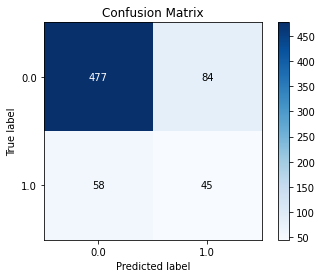

In [146]:
# check confusion matrix
skplt.metrics.plot_confusion_matrix(ytest, dtree_pred_result)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 45 (True Positive)
*   The model predicted not response and the customer actually response is 58 (False Negative)
*   The model predicted response and the customer actually not response is 84 (False Positive)
*   The model predicted not response and the customer actually not response is 477 (True Negative)


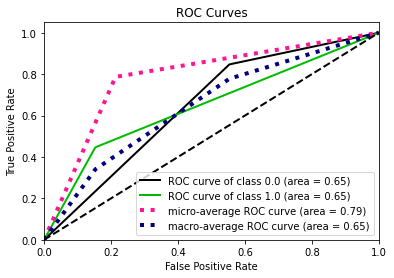

In [147]:
# check ROC-AUC curve and result
skplt.metrics.plot_roc_curve(ytest, dtree_pred_proba_result);

**ROC-AUC Visualization**

The model not completely success to distinct between True Positive and True Negative with chance 65%. Which is mean that the model do a lot of wrong prediction.

In [148]:
# check model accuracy
dtree_accuracy = metrics.accuracy_score(ytest, dtree_pred_result)
print("The accuracy score for Decision Tree is:",dtree_accuracy,'\n')

# check f1-score
dtree_f1_score = metrics.f1_score(ytest,dtree_pred_result)
print("The F1 score on Decision Tree is:",dtree_f1_score,'\n')

The accuracy score for Decision Tree is: 0.786144578313253 

The F1 score on Decision Tree is: 0.3879310344827586 



**Tree Visualization**

In [ ]:
fig, _ = plt.subplots(nrows=1, ncols=1, figsize=(100,50), dpi=300)
tree.plot_tree(
    decision_tree,
    feature_names=Xt.columns,
    filled=True
)
fig.savefig('tree.png')

**Tree Visualization using ELI5**

In [ ]:
dtree_var_name = data.drop(['Response'], axis = 1).columns.tolist()

eli5.sklearn.explain_decision_tree(decision_tree, feature_names=dtree_var_name)

Weight,Feature
0.1662,Income
0.1629,Recency
0.1464,Expenditure
0.1067,AcceptedCmp5
0.0779,NumWebVisitsMonth
0.0744,Age
0.0628,Frequency
0.0498,AcceptedCmp3
0.0472,Education
0.0423,AcceptedCmp1


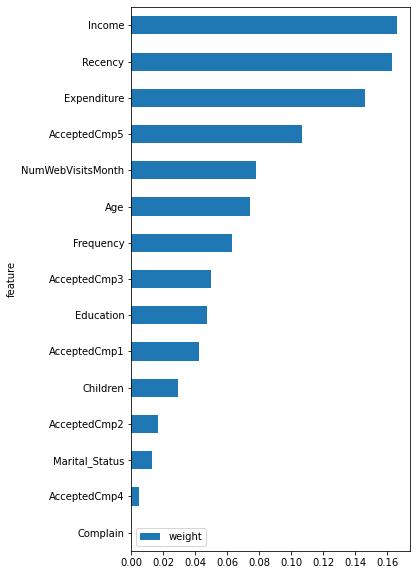

In [ ]:
# gini features important
eli5.explain_weights_df(decision_tree, feature_names=dtree_var_name). \
  sort_values(by='weight'). \
  plot(
    x = 'feature', 
    y = 'weight',
    kind = 'barh',
    figsize = (5, 10)
  )

In [ ]:
print(export_text(decision_tree, feature_names = dtree_var_name))

|--- AcceptedCmp5 <= 0.50
|   |--- AcceptedCmp3 <= 0.50
|   |   |--- Recency <= 0.19
|   |   |   |--- NumWebVisitsMonth <= 0.42
|   |   |   |   |--- AcceptedCmp1 <= 0.50
|   |   |   |   |   |--- NumWebVisitsMonth <= 0.38
|   |   |   |   |   |   |--- Income <= 0.49
|   |   |   |   |   |   |   |--- AcceptedCmp2 <= 0.50
|   |   |   |   |   |   |   |   |--- Age <= 0.83
|   |   |   |   |   |   |   |   |   |--- Frequency <= 0.61
|   |   |   |   |   |   |   |   |   |   |--- Expenditure <= 0.55
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 10
|   |   |   |   |   |   |   |   |   |   |--- Expenditure >  0.55
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- Frequency >  0.61
|   |   |   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |   |--- Age >  0.83
|   |   |   |   |   |   |   |   |   |--- Recency <= 0.03
|   |   |   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |  

### Random Forest

In [149]:
# build a model of Random Forest
random_forest = RandomForestClassifier()
random_forest.fit(Xt,yt)

RandomForestClassifier()

**Model Evaluation**

In [150]:
# prediction
rf_pred_result = random_forest.predict(Xtest)
rf_pred_proba_result = random_forest.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, rf_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.890344,0.679245,0.873494,0.784794,0.857598
recall,0.969697,0.349515,0.873494,0.659606,0.873494
f1-score,0.928328,0.461538,0.873494,0.694933,0.855919
support,561.000000,103.000000,0.873494,664.000000,664.000000


With Random Forest model, we got:

1.   `Precision`: 89.03% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 96.96%
3.   `F1-Score`: F1-Score value of 92.83% of comparison on Precision and Recall.

Confusion Matrix for Random Forest Model is:
 AxesSubplot(0.125,0.125;0.62x0.755)


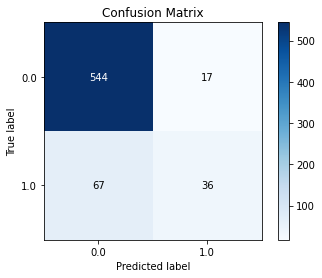

In [151]:
# check confusion matrix
rf_cm = skplt.metrics.plot_confusion_matrix(ytest, rf_pred_result)
print('Confusion Matrix for Random Forest Model is:\n',rf_cm)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 36 (True Positive)
*   The model predicted not response and the customer actually response is 67 (False Negative)
*   The model predicted response and the customer actually not response is 17 (False Positive)
*   The model predicted not response and the customer actually not response is 544 (True Negative)


In [152]:
rf_cv_score = cross_val_score(random_forest, Xt, yt, cv=10, scoring='roc_auc')
print("All AUC Scores",rf_cv_score,'\n')
print("Mean AUC Score - Random Forest: ", rf_cv_score.mean())

All AUC Scores [0.84189723 0.83316864 0.90727931 0.90200922 0.80451252 0.82888669
 0.8578722  0.9314888  0.89328063 0.85247262] 

Mean AUC Score - Random Forest:  0.8652867875569502


Below is the ROC-AUC result on Random Forest:
 AxesSubplot(0.125,0.125;0.775x0.755) 



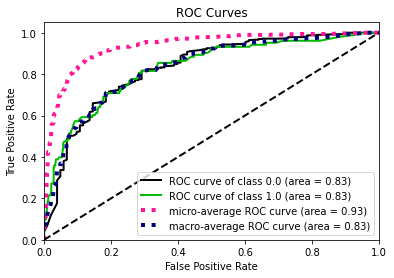

In [153]:
# check ROC-AUC curve and result
rf_roc_auc = skplt.metrics.plot_roc_curve(ytest, rf_pred_proba_result)
print("Below is the ROC-AUC result on Random Forest:\n",rf_roc_auc,'\n')

**ROC-AUC Visualization**

The model success to distinct between True Positive and True Negative with chance 83%. Which is mean that the model can be use to do prediction.

In [154]:
# check model accuracy
rf_accuracy = metrics.accuracy_score(ytest, rf_pred_result)
print("The accuracy score for Random Forest is:",rf_accuracy,'\n')

# check f1-score
rf_f1_score = metrics.f1_score(ytest,rf_pred_result)
print("The F1 score on Random Forest is:",rf_f1_score,'\n')

The accuracy score for Random Forest is: 0.8734939759036144 

The F1 score on Random Forest is: 0.46153846153846156 



### Hyperparameter Random Forest

In [155]:
# number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# number of features at every split
max_features = ['auto','sqrt']

# max depth
max_depth = [int(x) for x in np.linspace(100, 500, num = 11)]
max_depth.append(None)
# create random grid
random_grid = {
 'n_estimators': n_estimators,
 'max_features': max_features,
 'max_depth': max_depth
 }
# Random search of parameters
random_forest_hyper = RandomizedSearchCV(estimator = random_forest, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the model
random_forest_hyper.fit(Xt,yt)
# print results
print(random_forest_hyper.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
{'n_estimators': 800, 'max_features': 'sqrt', 'max_depth': 460}


In [156]:
best_param_rfc = RandomForestClassifier(n_estimators= 800, max_features= 'sqrt', max_depth= 460)
best_param_rfc.fit(Xt,yt)

RandomForestClassifier(max_depth=460, max_features='sqrt', n_estimators=800)

In [157]:
# prediction
best_param_rfc_pred_result = best_param_rfc.predict(Xtest)
best_param_rfc_pred_proba_result = best_param_rfc.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, best_param_rfc_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.893092,0.678571,0.875,0.785832,0.859816
recall,0.967914,0.368932,0.875,0.668423,0.875000
f1-score,0.928999,0.477987,0.875,0.703493,0.859038
support,561.000000,103.000000,0.875,664.000000,664.000000


With Random Forest model, we got:

1.   `Precision`: 89.30% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 96.79% which is decreased in small value.
3.   `F1-Score`: F1-Score value of 92.89% of comparison on Precision and Recall.

Confusion Matrix on Random Forest with Hyperparameter Tuning:
 AxesSubplot(0.125,0.125;0.62x0.755)


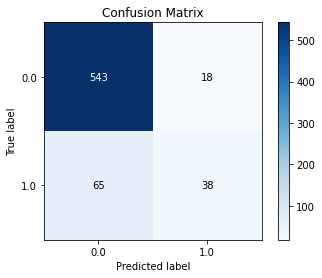

In [158]:
# check confusion matrix
best_param_rfc_cm = skplt.metrics.plot_confusion_matrix(ytest, best_param_rfc_pred_result)
print('Confusion Matrix on Random Forest with Hyperparameter Tuning:\n',best_param_rfc_cm)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 38 (True Positive)
*   The model predicted not response and the customer actually response is 65 (False Negative)
*   The model predicted response and the customer actually not response is 18 (False Positive)
*   The model predicted not response and the customer actually not response is 543 (True Negative)


In [159]:
best_param_rfc_cv_score = cross_val_score(best_param_rfc, Xt, yt, cv=10, scoring='roc_auc')
print("All AUC Scores",best_param_rfc_cv_score,'\n')
print("Mean AUC Score - Hyperparameter Tuning Random Forest: ", best_param_rfc_cv_score.mean())

All AUC Scores [0.84387352 0.83333333 0.9229249  0.90349144 0.80467721 0.84486166
 0.85326087 0.93445323 0.89608037 0.84102224] 

Mean AUC Score - Hyperparameter Tuning Random Forest:  0.8677978758712246


Below is the ROC-AUC result on Hyperparameter Tuning on Random Forest:
 AxesSubplot(0.125,0.125;0.775x0.755) 



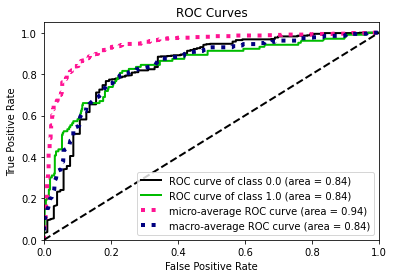

In [160]:
# check ROC-AUC curve and result
best_param_rfc_roc_auc = skplt.metrics.plot_roc_curve(ytest, best_param_rfc_pred_proba_result)
print("Below is the ROC-AUC result on Hyperparameter Tuning on Random Forest:\n",best_param_rfc_roc_auc,'\n')

**ROC-AUC Visualization**

The model success to distinct between True Positive and True Negative with chance 84%. Which is mean that the model can be use to do prediction even the value increased only 1%.

In [161]:
# check model accuracy
best_param_rfc_accuracy = metrics.accuracy_score(ytest, best_param_rfc_pred_result)
print("The accuracy score for Hyperparameter Tuning on Random Forest is:",best_param_rfc_accuracy,'\n')

# check f1-score
best_param_rfc_f1_score = metrics.f1_score(ytest,best_param_rfc_pred_result)
print("The F1 score on Hyperparameter Tuning on Random Forest is:",best_param_rfc_f1_score,'\n')

The accuracy score for Hyperparameter Tuning on Random Forest is: 0.875 

The F1 score on Hyperparameter Tuning on Random Forest is: 0.47798742138364775 



### Rule Fit Model

In [162]:
# define RuleFit model
rulefit_clf = SkopeRules(
    n_estimators = 10,
    random_state = 1000,
    max_features = 'sqrt',
    feature_names = var_name
)

# fit model to data
rulefit_clf.fit(Xt,yt)

SkopeRules(feature_names=['Education', 'Marital_Status', 'Income', 'Recency',
                          'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4',
                          'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
                          'Complain', 'Age', 'Expenditure', 'Frequency',
                          'Children'],
           max_features='sqrt', random_state=1000)

In [163]:
rulefit_clf.estimators_

[DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1970544363),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1077348022),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt', random_state=473922508),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=2113565594),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1173624936),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1474976016),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1528487102),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt',
                        random_state=1071226617),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt', random_state=499256588),
 DecisionTreeClassifier(max_depth=3, max_features='sqrt', random_state=9065945

In [164]:
# prediction
rulefit_pred_result = rulefit_clf.predict(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, rulefit_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.897569,0.500000,0.84488,0.698785,0.835898
recall,0.921569,0.427184,0.84488,0.674377,0.844880
f1-score,0.909411,0.460733,0.84488,0.685072,0.839812
support,561.000000,103.000000,0.84488,664.000000,664.000000


With Rule Fit model, we got:

1.   `Precision`: 89.75% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 92.15%.
3.   `F1-Score`: F1-Score value of 90.94% of comparison on Precision and Recall.

In [165]:
# check model accuracy
metrics.accuracy_score(ytest, rulefit_pred_result)

0.8448795180722891

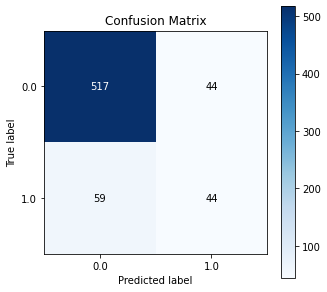

In [166]:
# check confusion matrix
rulefit_cm = skplt.metrics.plot_confusion_matrix(ytest, rulefit_pred_result, figsize=(5,5))

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 44 (True Positive)
*   The model predicted not response and the customer actually response is 59 (False Negative)
*   The model predicted response and the customer actually not response is 44 (False Positive)
*   The model predicted not response and the customer actually not response is 517 (True Negative)


In [167]:
# check ROC-AUC Curve
scoring = rulefit_clf.score_top_rules(Xtest)
fpr, tpr, _ = metrics.roc_curve(ytest, scoring)

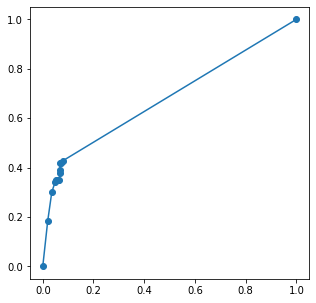

In [168]:
plt.figure(figsize=(5,5))
plt.plot(fpr,tpr, 'o-')
plt.show()

In [169]:
metrics.auc(fpr, tpr)

0.6786771195680391

In [170]:
# check F1-score
metrics.f1_score(ytest, rulefit_pred_result)

0.4607329842931937

In [171]:
# extract rules from rule-fit model
rulefit_clf.rules_

[('Expenditure > 0.5517857074737549 and Recency <= 0.8535353541374207 and AcceptedCmp5 > 0.5',
  (0.7037037037037037, 0.20105820105820105, 2)),
 ('Recency <= 0.8181818127632141 and AcceptedCmp1 > 0.5 and AcceptedCmp2 <= 0.5',
  (0.5967741935483871, 0.20441988950276244, 2)),
 ('Age > 0.27358490228652954 and Income <= 0.5810496211051941 and AcceptedCmp5 > 0.5',
  (0.5245901639344263, 0.17486338797814208, 2)),
 ('Children <= 0.1666666716337204 and Recency > 0.19696969538927078 and AcceptedCmp5 > 0.5',
  (0.5263157894736842, 0.16483516483516483, 2)),
 ('Expenditure > 0.6172618865966797 and AcceptedCmp5 > 0.5',
  (0.5, 0.15730337078651685, 2)),
 ('Marital_Status <= 0.5 and Children <= 0.1666666716337204 and AcceptedCmp1 > 0.5',
  (0.782608695652174, 0.0972972972972973, 2)),
 ('Age <= 0.27358490228652954 and Income <= 0.5810496211051941 and AcceptedCmp5 > 0.5',
  (0.7391304347826086, 0.09289617486338798, 2)),
 ('Frequency > 0.578125 and Income > 0.5013163983821869 and AcceptedCmp1 > 0.5',
  

In [172]:
print('The 5 most performing "Response" are the following one:\n')
for i_rule, rule in enumerate(rulefit_clf.rules_[:5]):
    print(rule[0])

The 5 most performing "Response" are the following one:

Expenditure > 0.5517857074737549 and Recency <= 0.8535353541374207 and AcceptedCmp5 > 0.5
Recency <= 0.8181818127632141 and AcceptedCmp1 > 0.5 and AcceptedCmp2 <= 0.5
Age > 0.27358490228652954 and Income <= 0.5810496211051941 and AcceptedCmp5 > 0.5
Children <= 0.1666666716337204 and Recency > 0.19696969538927078 and AcceptedCmp5 > 0.5
Expenditure > 0.6172618865966797 and AcceptedCmp5 > 0.5


In [173]:
# extract rules and its importance
rules = []
evaluation = []
for result in rulefit_clf.rules_:
  rl, evl = result
  rules.append(rl)
  evaluation.append(evl[0])

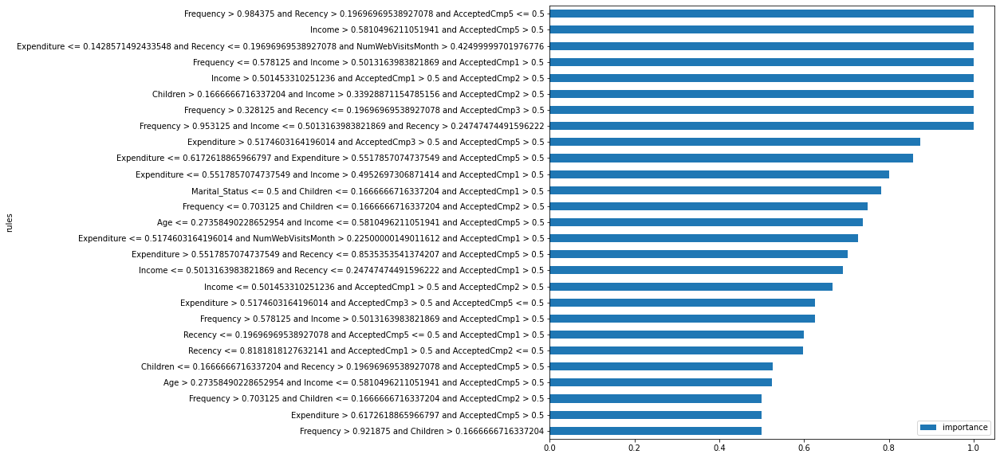

In [174]:
# visualize
pd.DataFrame(
    {"rules": rules, "importance": evaluation}
).sort_values(
    by = "importance"
).plot(
    x = "rules",
    y = "importance",
    kind = 'barh',
    figsize = (10, 10)
);

### Multi-Layered Perceptron

In [175]:
MLPC = MLPClassifier(hidden_layer_sizes=(150,100,50), max_iter=300,activation = 'relu',solver='adam',random_state=1)
MLPC.fit(Xt,yt)

MLPClassifier(hidden_layer_sizes=(150, 100, 50), max_iter=300, random_state=1)

**Model Evaluation**

In [177]:
# prediction
MLPC_pred_result = MLPC.predict(Xtest)
MLPC_pred_proba_result = MLPC.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, MLPC_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.894118,0.579710,0.861446,0.736914,0.845347
recall,0.948307,0.388350,0.861446,0.668328,0.861446
f1-score,0.920415,0.465116,0.861446,0.692766,0.849789
support,561.000000,103.000000,0.861446,664.000000,664.000000


With Random Forest model, we got:

1.   `Precision`: 89.41% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 94.83%
3.   `F1-Score`: F1-Score value of 92.04% of comparison on Precision and Recall.

Confusion Matrix on Multi Layer Perceptron Classifier:
 <module 'matplotlib.cm' from '/usr/local/lib/python3.7/dist-packages/matplotlib/cm.py'>


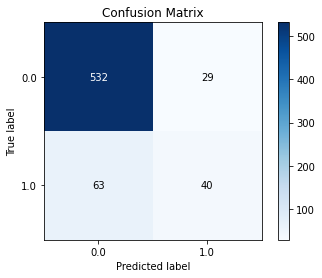

In [178]:
# check confusion matrix
MLPC_cm = skplt.metrics.plot_confusion_matrix(ytest, MLPC_pred_result)
print('Confusion Matrix on Multi Layer Perceptron Classifier:\n',cm)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 40 (True Positive)
*   The model predicted not response and the customer actually response is 63 (False Negative)
*   The model predicted response and the customer actually not response is 29 (False Positive)
*   The model predicted not response and the customer actually not response is 532 (True Negative)


In [179]:
MLPC_cv_score = cross_val_score(MLPC, Xt, yt, cv=10, scoring='roc_auc')
print("All AUC Scores",MLPC_cv_score,'\n')
print("Mean AUC Score - Multi Layer Perceptron: ", MLPC_cv_score.mean())

All AUC Scores [0.82213439 0.80747694 0.85474308 0.73089592 0.75625823 0.79479578
 0.75197628 0.81357049 0.85046113 0.80882841] 

Mean AUC Score - Multi Layer Perceptron:  0.7991140663186795


Below is the ROC-AUC result on Multi Layer Perceptron:
 AxesSubplot(0.125,0.125;0.775x0.755) 



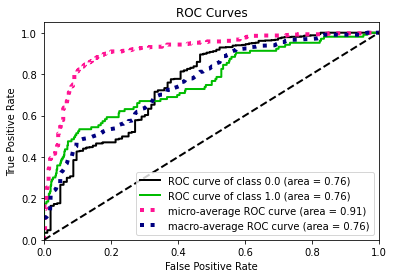

In [180]:
# check ROC-AUC curve and result
MLPC_roc_auc = skplt.metrics.plot_roc_curve(ytest, MLPC_pred_proba_result)
print("Below is the ROC-AUC result on Multi Layer Perceptron:\n",MLPC_roc_auc,'\n')

**ROC-AUC Visualization**

The model succeed to distinct between True Positive and True Negative with chance 76%

In [181]:
# check model accuracy
MLPC_accuracy = metrics.accuracy_score(ytest, MLPC_pred_result)
print("The accuracy score for Multi Layer Perceptron is:",MLPC_accuracy,'\n')

# check f1-score
MLPC_f1_score = metrics.f1_score(ytest,MLPC_pred_result)
print("The F1 score on Multi Layer Perceptron is:",MLPC_f1_score,'\n')

The accuracy score for Multi Layer Perceptron is: 0.8614457831325302 

The F1 score on Multi Layer Perceptron is: 0.4651162790697675 



### XG-Boost

In [182]:
xgc = XGBClassifier()
xgc.fit(Xt,yt)

XGBClassifier()

**Model Evaluation**

In [183]:
# prediction
xgc_pred_result = xgc.predict(Xtest)
xgc_pred_proba_result = xgc.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, xgc_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.897858,0.719298,0.88253,0.808578,0.870160
recall,0.971480,0.398058,0.88253,0.684769,0.882530
f1-score,0.933219,0.512500,0.88253,0.722860,0.867957
support,561.000000,103.000000,0.88253,664.000000,664.000000


With Random Forest model, we got:

1.   `Precision`: 89.78% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 97.14%
3.   `F1-Score`: F1-Score value of 93.32% of comparison on Precision and Recall.

Confusion Matrix on XGBoost:
 AxesSubplot(0.125,0.125;0.62x0.755)


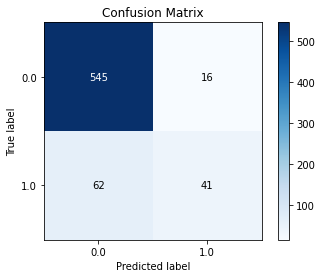

In [184]:
# check confusion matrix
xgc_cm = skplt.metrics.plot_confusion_matrix(ytest, xgc_pred_result)
print('Confusion Matrix on XGBoost:\n',xgc_cm)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 41 (True Positive)
*   The model predicted not response and the customer actually response is 62 (False Negative)
*   The model predicted response and the customer actually not response is 16 (False Positive)
*   The model predicted not response and the customer actually not response is 545 (True Negative)


In [185]:
xgc_cv_score = cross_val_score(xgc, Xt, yt, cv=10, scoring='roc_auc')
print("All AUC Scores",xgc_cv_score,'\n')
print("Mean AUC Score - XGBoost: ", xgc_cv_score.mean())

All AUC Scores [0.87318841 0.86149539 0.93445323 0.92490119 0.81818182 0.82806324
 0.85737813 0.90810277 0.88768116 0.86325921] 

Mean AUC Score - XGBoost:  0.8756704532882761


Below is the ROC-AUC result on XGBoost:
 AxesSubplot(0.125,0.125;0.775x0.755) 



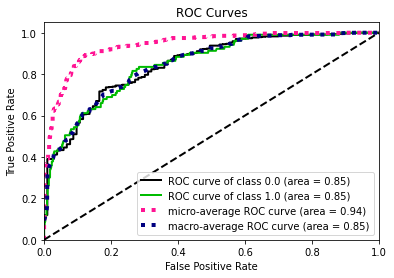

In [186]:
# check ROC-AUC curve and result
xgc_roc_auc = skplt.metrics.plot_roc_curve(ytest, xgc_pred_proba_result)
print("Below is the ROC-AUC result on XGBoost:\n",xgc_roc_auc,'\n')

**ROC-AUC Visualization**

The model succeed to distinct between True Positive and True Negative with chance 85%

In [187]:
# check model accuracy
xgc_accuracy = metrics.accuracy_score(ytest, xgc_pred_result)
print("The accuracy score for XGBoost is:",xgc_accuracy,'\n')

# check f1-score
xgc_f1_score = metrics.f1_score(ytest,xgc_pred_result)
print("The F1 score on XGBoost is:",xgc_f1_score,'\n')

The accuracy score for XGBoost is: 0.8825301204819277 

The F1 score on XGBoost is: 0.5125 



### XG-Boost Hyperparameter

In [197]:
params = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01,0.05,0.1],
    'booster': ['gbtree', 'gblinear'],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.5, 1],
    'reg_lambda': [0.5, 1, 5],
    'base_score': [0.2, 0.5, 1]
}

gs2 = GridSearchCV(XGBClassifier(n_jobs=-1), params, n_jobs=-1, cv=KFold(n_splits=3), scoring='roc_auc')
gs2.fit(Xt,yt)

print('Best score:', gs2.best_score_)
print('Best score:', gs2.best_params_)

Best score: 0.8682151333164702
Best score: {'base_score': 0.2, 'booster': 'gbtree', 'gamma': 1, 'learning_rate': 0.1, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 5}


In [200]:
xgc_hyper = XGBClassifier(base_score= 0.2, booster= 'gbtree', gamma= 1, learning_rate= 0.1, n_estimators= 200, reg_alpha= 0, reg_lambda= 5)
xgc_hyper1 = xgc_hyper.fit(Xt,yt)

**Model Evaluation**

In [201]:
# prediction
xgc_hyper_pred_result = xgc_hyper1.predict(Xtest)
xgc_hyper_pred_proba_result = xgc_hyper1.predict_proba(Xtest)

# check classification report result
pd.DataFrame(metrics.classification_report(ytest, xgc_hyper_pred_result, target_names=['Do Not Response','Responsed'], output_dict=True))

,Do Not Response,Responsed,accuracy,macro avg,weighted avg
precision,0.898194,0.745455,0.885542,0.821824,0.874501
recall,0.975045,0.398058,0.885542,0.686551,0.885542
f1-score,0.935043,0.518987,0.885542,0.727015,0.870504
support,561.000000,103.000000,0.885542,664.000000,664.000000


With Random Forest model, we got:

1.   `Precision`: 89.81% of the model correctly predicts that the customer does not use the given promo.
2.   `Recall`: the sensitivity of the model is 97.5%
3.   `F1-Score`: F1-Score value of 93.5% of comparison on Precision and Recall.

Confusion Matrix on XGBoost with Hyperparameter Tuning:
 AxesSubplot(0.125,0.125;0.62x0.755)


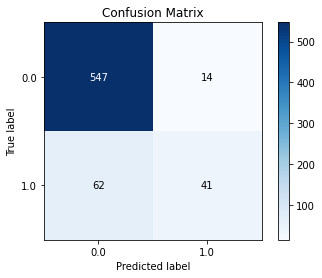

In [202]:
# check confusion matrix
xgc_hyper_cm = skplt.metrics.plot_confusion_matrix(ytest, xgc_hyper_pred_result)
print('Confusion Matrix on XGBoost with Hyperparameter Tuning:\n',xgc_hyper_cm)

**Confusion Matrix**

Interpretation of Confusion Matrix on Decision Tree:

*   The model predicted response and the customer actually response is 41 (True Positive)
*   The model predicted not response and the customer actually response is 62 (False Negative)
*   The model predicted response and the customer actually not response is 14 (False Positive)
*   The model predicted not response and the customer actually not response is 547 (True Negative)


In [204]:
xgc_hyper_cv_score = cross_val_score(xgc_hyper1, Xt, yt, cv=10, scoring='roc_auc')
print("All AUC Scores",xgc_hyper_cv_score,'\n')
print("Mean AUC Score - XGBoost with Hyperparameter Tuning: ", xgc_hyper_cv_score.mean())

All AUC Scores [0.87417655 0.85194335 0.92786561 0.91897233 0.80797101 0.83860343
 0.86660079 0.91337286 0.89624506 0.85363425] 

Mean AUC Score - XGBoost with Hyperparameter Tuning:  0.8749385239718794


Below is the ROC-AUC result on XGBoost with Hyperparameter Tuning:
 AxesSubplot(0.125,0.125;0.775x0.755) 



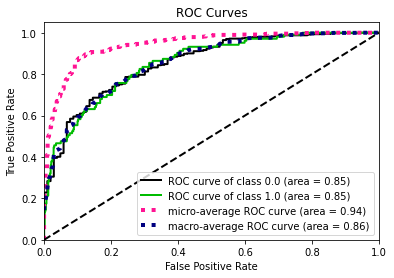

In [205]:
# check ROC-AUC curve and result
xgc_hyper_roc_auc = skplt.metrics.plot_roc_curve(ytest, xgc_hyper_pred_proba_result)
print("Below is the ROC-AUC result on XGBoost with Hyperparameter Tuning:\n",xgc_roc_auc,'\n')

**ROC-AUC Visualization**

The model succeed to distinct between True Positive and True Negative with chance 85%

In [206]:
# check model accuracy
xgc_hyper_accuracy = metrics.accuracy_score(ytest, xgc_hyper_pred_result)
print("The accuracy score for XGBoost with Hyperparameter Tuning is:",xgc_hyper_accuracy,'\n')

# check f1-score
xgc_hyper_f1_score = metrics.f1_score(ytest,xgc_hyper_pred_result)
print("The F1 score on XGBoost with Hyperparameter Tuning is:",xgc_hyper_f1_score,'\n')

The accuracy score for XGBoost with Hyperparameter Tuning is: 0.8855421686746988 

The F1 score on XGBoost with Hyperparameter Tuning is: 0.518987341772152 



## **Model Comparison**

In [210]:
logreg = metrics.accuracy_score(ytest, y_pred_logreg)*100
logreg_hyper = metrics.accuracy_score(ytest, y_pred_logreg_hyper)*100
decisiontree = metrics.accuracy_score(ytest, dtree_pred_result)*100
rfa = metrics.accuracy_score(ytest, rf_pred_result)*100
rfc_hyper = metrics.accuracy_score(ytest, best_param_rfc_pred_result)*100
rulefita = metrics.accuracy_score(ytest, rulefit_pred_result)*100
mlpca = metrics.accuracy_score(ytest, MLPC_pred_result)*100
xgca = metrics.accuracy_score(ytest, xgc_pred_result)*100
xgch = metrics.accuracy_score(ytest, xgc_hyper_pred_result)*100

Text(0.5, 1.0, 'Plotting the Model Accuracies')

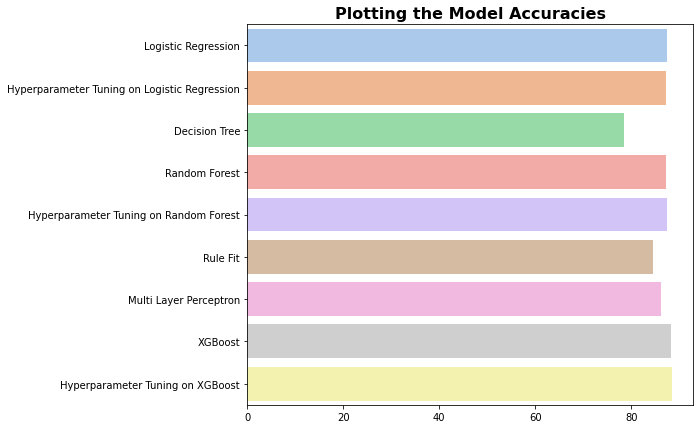

In [211]:
plt.figure(figsize= (8,7))
ac = [logreg, logreg_hyper, decisiontree, rfa, rfc_hyper, rulefita, mlpca, xgca, xgch]
name = ['Logistic Regression','Hyperparameter Tuning on Logistic Regression','Decision Tree','Random Forest','Hyperparameter Tuning on Random Forest','Rule Fit','Multi Layer Perceptron','XGBoost','Hyperparameter Tuning on XGBoost']
sns.barplot(x = ac,y = name,palette='pastel')
plt.title("Plotting the Model Accuracies", fontsize=16, fontweight="bold")

The best and fit models is XGboost with Hyperparameter Tuning.

[Vishal Morde](https://medium.com/@vishalmorde) and [Venkat Setty](https://medium.com/@setgeti) have written about XGBoost with the title of "[XGBoost Algorithm: Long May She Reign!](https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d)".

XGBoost is a decision-tree-based ensemble Machine Learning algorithm that uses a gradient boosting framework. In prediction problems involving unstructured data (images, text, etc.) artificial neural networks tend to outperform all other algorithms or frameworks. However, when it comes to small-to-medium structured/tabular data, decision tree based algorithms are considered best-in-class right now.

## **Model Interpretation**

Miller (2017) defines Interpretability, Interpretability is the extent to which humans can understand the causes of decisions. Interpretability is the extent to which humans can consistently predict the results of the model. The higher the interpretability of a machine learning model, the easier it is for one to understand why certain decisions or predictions have been made. A model can be interpreted better than another model if its decisions are easier for humans to understand than decisions from other models.

In [217]:
# print the JS visualization code
shap.initjs()

In [223]:
explainer = shap.TreeExplainer(xgc_hyper)
shap_values = explainer.shap_values(Xt[:500])

In [224]:
# visualization
shap.force_plot(explainer.expected_value, shap_values[0,:], Xtest.iloc[0,:])

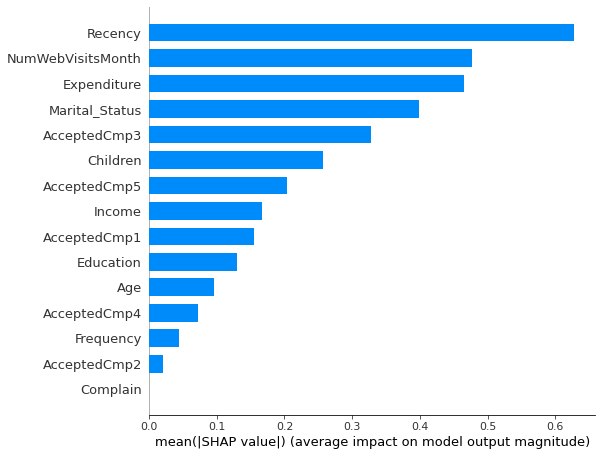

In [226]:
shap.summary_plot(shap_values, Xt, plot_type="bar")

SHAP values has feature importance with explainer where 5 highest importance variable is `Recency`, `NumWebVisitsMonth`, `Expenditure`, `AcceptedCmp3`, `Children`.

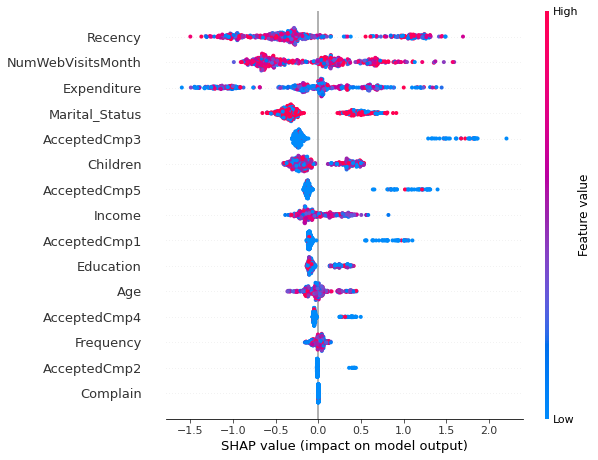

In [227]:
shap.summary_plot(shap_values, Xt[500:1000])

From what we could see on beeswarm plot, it's still hard to determine the direction of the feature and what the interpretation of the features because the data features distribution for each Response distributed randomly.

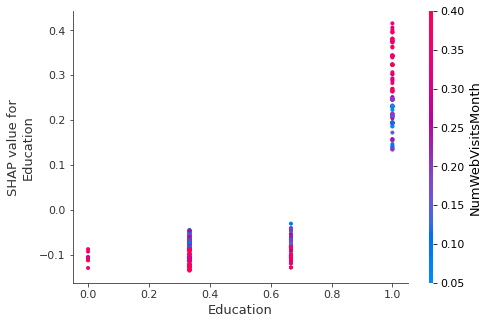

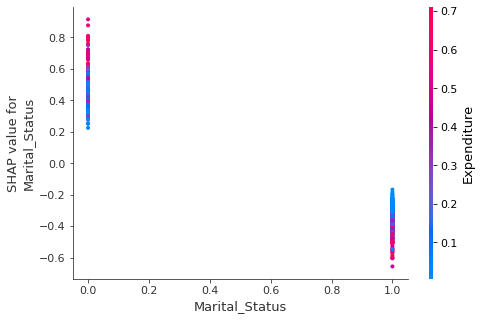

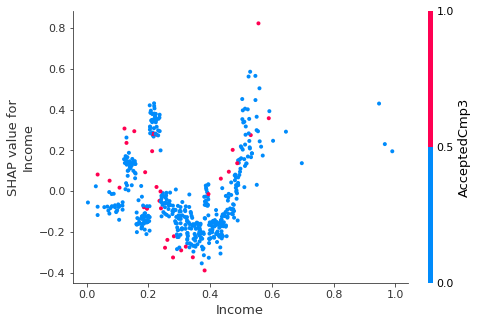

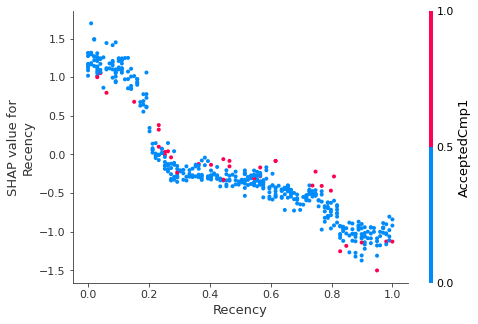

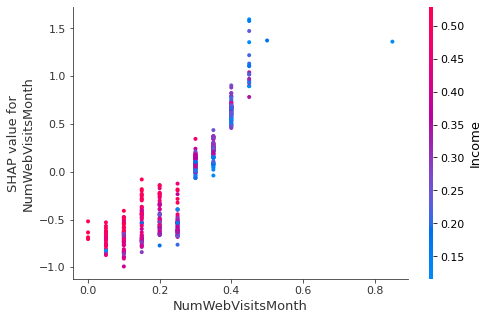

...

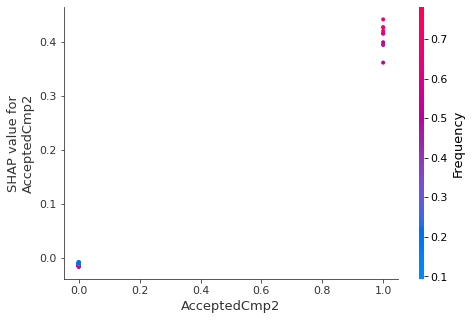

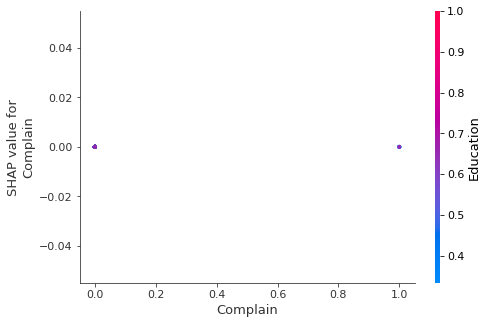

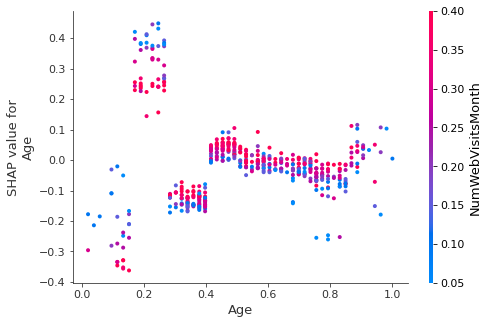

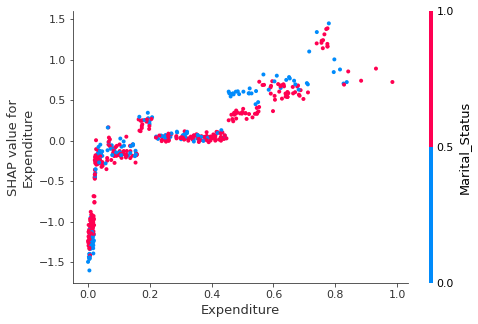

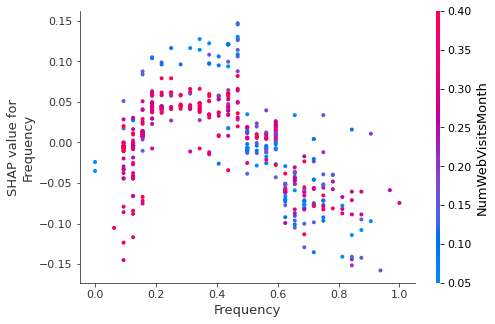

Exception ignored in: <function Booster.__del__ at 0x7f51bbd48a70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/xgboost/core.py", line 957, in __del__
    if self.handle is not None:
AttributeError: 'Booster' object has no attribute 'handle'


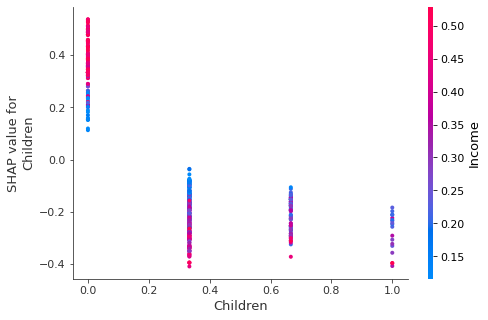

In [231]:
for name in Xt.columns:
    shap.dependence_plot(name, shap_values, Xt[:500], display_features=Xtest)

From Dependence Plot above, we could seen the ralation between each features. THe determine of those visualization are:

1.   Many of the customers with highly educated backgrounds visit the company's website more often than others.
2.   Customers in the young adult age range visit the company's website more often than customers in other age ranges.
3.   Married customers spend more money than single customers.
4.   Annual income affects revenue in the third campaign method.
5.   The first campaign method cannot be said to not return customers to return to shop again at the company. This can be seen in customer recency which does not increase.
6.   The fourth campaign method has a good customer response as shown in the high customer recency variable. So that the fourth campaign can make customers return to shop at the company.

